In [1]:
from train_0 import *
import matplotlib.pyplot as plt
from net.metric import compute_average_precision_for_mask
from dataset.transform import *
from net.resnet50_mask_rcnn.draw import *
from common import *

os.environ['CUDA_VISIBLE_DEVICES'] = '4'  #'3,2' #'3,2,1,0'

def pad_to_factor(image, factor=16):
    height,width = image.shape[:2]
    h = math.ceil(height/factor)*factor
    w = math.ceil(width/factor)*factor

    image = cv2.copyMakeBorder(image, top=0, bottom=h-height, left=0, right=w-width,
                               borderType= cv2.BORDER_REFLECT101, value=[0,0,0] )

    return image


def eval_augment(image, mask, meta, index):
    image = pad_to_factor(image, factor=16)
    pad_image = scale_image_canals(image)
    mask = pad_to_factor(mask, factor=16)
    HEIGHT, WIDTH, _ = pad_image.shape
    
    input = torch.from_numpy(pad_image.transpose((2,0,1))).float().div(255)
    box, label, instance  = multi_mask_to_annotation(mask)
    foreground = (mask!=0).astype(np.float32)
    foreground = torch.from_numpy(foreground)

    return input, box, label, instance, meta, index, foreground, image

def train_collate(batch):

    batch_size = len(batch)
    #for b in range(batch_size): print (batch[b][0].size())
    inputs    = torch.stack([batch[b][0]for b in range(batch_size)], 0)
    boxes     =             [batch[b][1]for b in range(batch_size)]
    labels    =             [batch[b][2]for b in range(batch_size)]
    instances =             [batch[b][3]for b in range(batch_size)]
    metas     =             [batch[b][4]for b in range(batch_size)]
    indices   =             [batch[b][5]for b in range(batch_size)]
    foregrounds = torch.stack([batch[b][6]for b in range(batch_size)], 0)
    images    = [batch[b][7]for b in range(batch_size)]

    return [inputs, boxes, labels, instances, metas, indices, foregrounds, images]


def load_shapes(dir):          
    shapes = []                                                                                                                                                                                             
    for i in range(len(aspect_ratio)):                                                                                                                                                                   
        shapes.append(np.load(os.path.join(dir, 'shapes_%d.npy' % (i))))                                                                                                                                
    return shapes  

cfg = Configuration()
net = MaskRcnnNet(cfg).cuda()

if initial_checkpoint is not None:
    print('\tinitial_checkpoint = %s\n' % initial_checkpoint)
    net.load_state_dict(torch.load(initial_checkpoint, map_location=lambda storage, loc: storage))
    # cfg = load_pickle_file(out_dir +'/checkpoint/configuration.pkl')

## optimiser ----------------------------------
iter_accum  = 1
batch_size  = 1
if batch_size == 1:
    net.train_crf = True

num_iters   = 1000  *1000
iter_smooth = 20
iter_log    = 50
iter_valid  = 100
iter_save   = [0, num_iters-1]\
               + list(range(0,num_iters,200))#1*1000

def watershed(im):
    # Watershed
    im = (im * 255).astype(np.uint8)

    ret, thresh = cv2.threshold(im,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)

    kernel = np.ones((3,3),np.uint8)
    opening = cv2.morphologyEx(thresh,cv2.MORPH_OPEN,kernel, iterations = 2)


    sure_bg = cv2.dilate(opening,kernel,iterations=3)
    sure_bg = sure_bg

    # Finding sure foreground area
    # dist_transform = cv2.distanceTransform(opening,cv2.DIST_L2,5)
    # ret, sure_fg = cv2.threshold(dist_transform,0.7*dist_transform.max(),255,0)
    eroded_img = cv2.erode(im, kernel, iterations=3)
    sure_fg = ((eroded_img > 200) * 255).astype(np.uint8)

    # Finding unknown region
    sure_fg = np.uint8(sure_fg)
    unknown = cv2.subtract(sure_bg, sure_fg)

    ret, markers = cv2.connectedComponents(sure_fg)
    markers = markers+1
    markers[unknown==255] = 0

    im = im[:,:,np.newaxis]
    im = np.repeat(im, 3, axis=-1)
    im = im.astype(np.uint8)

    markers = cv2.watershed(im,markers)
    im[markers == -1] = [255,0,0]
    
    return markers
    
LR = None  #LR = StepLR([ (0, 0.01),  (200, 0.001),  (300, -1)])
optimizer = optim.SGD(filter(lambda p: p.requires_grad, net.parameters()),
                      lr=1e-2/iter_accum, momentum=0.9, weight_decay=1e-4)

set_name = os.path.join(ROOT_DIR, 'filenames/%s_train.csv' % (split))
train_dataset = ScienceDataset(DATA_DIR, set_name, transform=train_augment, mode='train')
train_loader  = DataLoader(
                    train_dataset,
                    sampler = SequentialSampler(train_dataset),
                    #sampler = ConstantSampler(train_dataset,list(range(16))),
                    batch_size  = batch_size,
                    drop_last   = False,
                    num_workers = 4,
                    pin_memory  = True,
                    collate_fn  = train_collate)

# shapes = get_shapes(ScienceDataset(DATA_DIR, set_name, transform=None, mode='train'))
print(os.getcwd())
shapes = load_shapes(os.getcwd())

set_name = os.path.join(ROOT_DIR, 'filenames/%s_val.csv' % (split))
valid_dataset = ScienceDataset(DATA_DIR, set_name, transform=valid_augment, mode='train')
valid_loader  = DataLoader(
                    valid_dataset,
                    sampler     = SequentialSampler(valid_dataset),
                    batch_size  = batch_size,
                    drop_last   = False,
                    num_workers = 4,
                    pin_memory  = True,
                    collate_fn  = train_collate)

set_name = os.path.join(ROOT_DIR, 'filenames/%s_val.csv' % (split))
eval_dataset = ScienceDataset(DATA_DIR, set_name, transform=eval_augment, mode='train')
eval_loader  = DataLoader(
                    eval_dataset,
                    sampler     = SequentialSampler(eval_dataset),
                    batch_size  = batch_size,
                    drop_last   = False,
                    num_workers = 4,
                    pin_memory  = True,
                    collate_fn  = train_collate)

@common.py:  
	set random seed
		SEED=35202
	set cuda environment
		torch.__version__              = 0.4.0
		torch.version.cuda             = 8.0.61
		torch.backends.cudnn.version() = 7102
		os['CUDA_VISIBLE_DEVICES']     = 0,1,2,3
		torch.cuda.device_count()      = 4
		torch.cuda.current_device()    = 0

	initial_checkpoint = /home/htang6/workspace/crfasrnn_my/results/crf2/checkpoint/00021600_model.pth

/home/htang6/workspace/crfasrnn_my/filenames/fluorescent_train.csv
/media/data/home/htang6/workspace/crfasrnn_my
/home/htang6/workspace/crfasrnn_my/filenames/fluorescent_val.csv
/home/htang6/workspace/crfasrnn_my/filenames/fluorescent_val.csv


## Evaluate

/home/htang6/anaconda3/lib/python3.6/site-packages/torch/nn/functional.py:1749: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


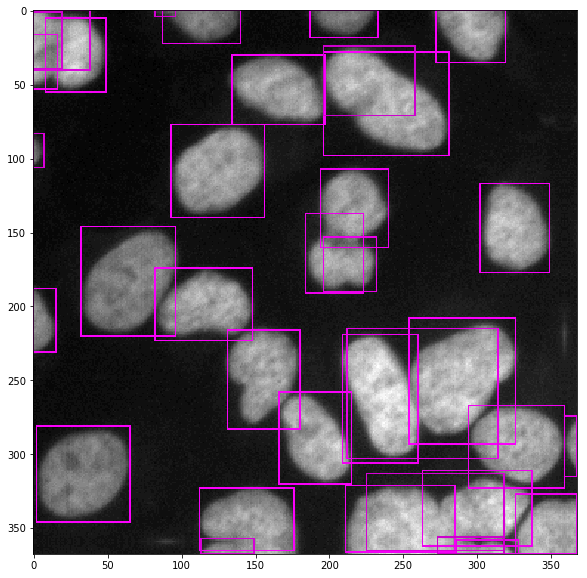

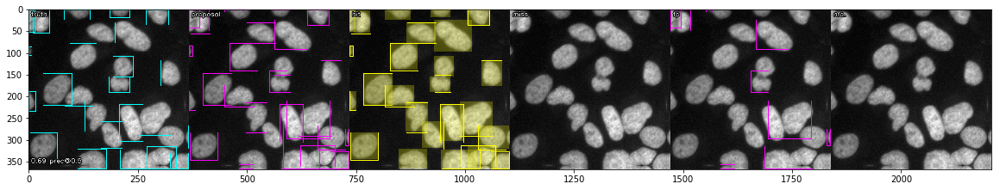

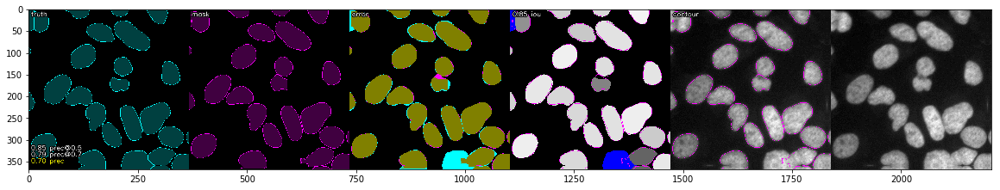

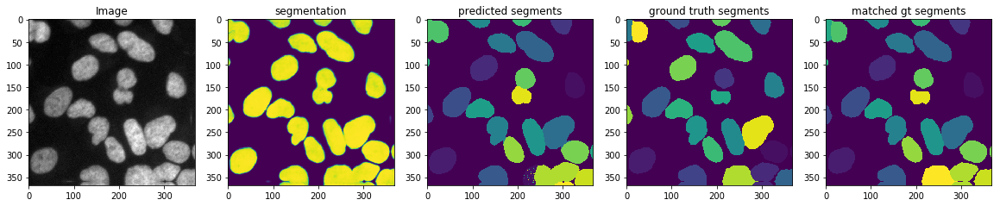

crf:  0.619678447299415
mask-rcnn:  0.6963684463684464


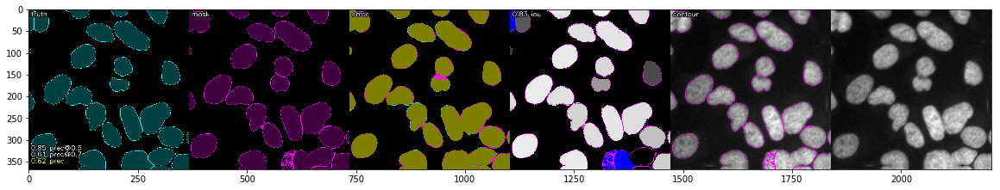

watershed:  0.4242225420854453
crf loss %f tensor(0.2752, device='cuda:0')
0 =======================================


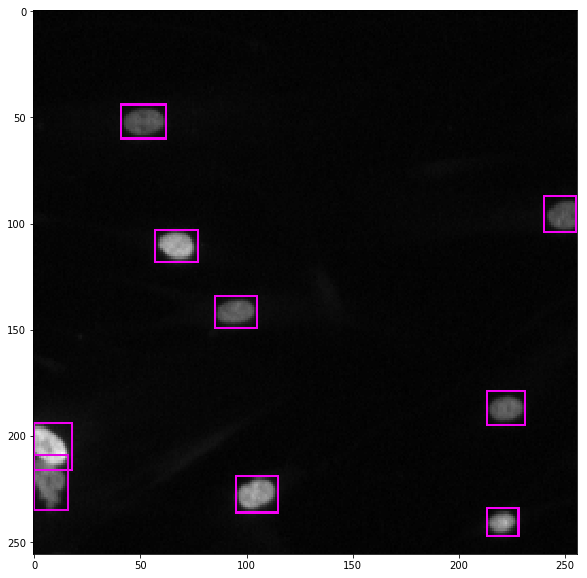

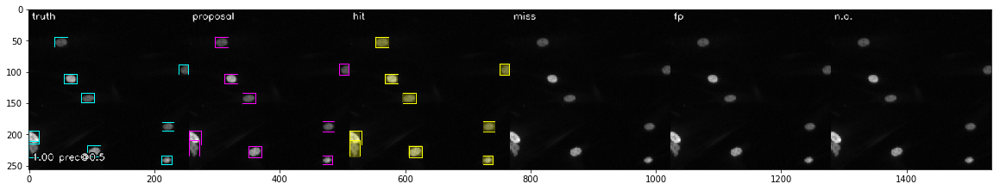

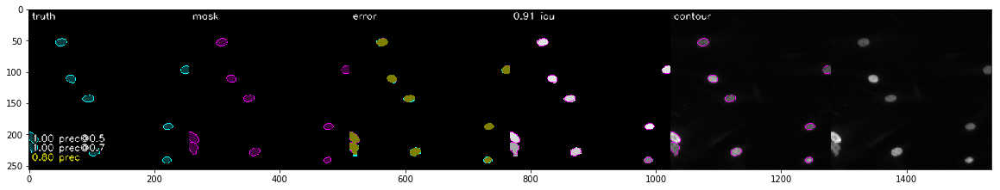

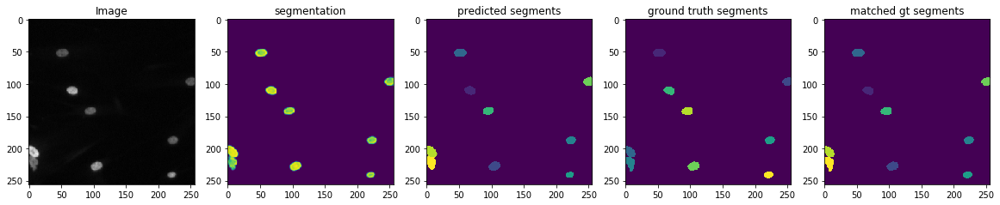

crf:  0.8299999999999998
mask-rcnn:  0.7997727272727273


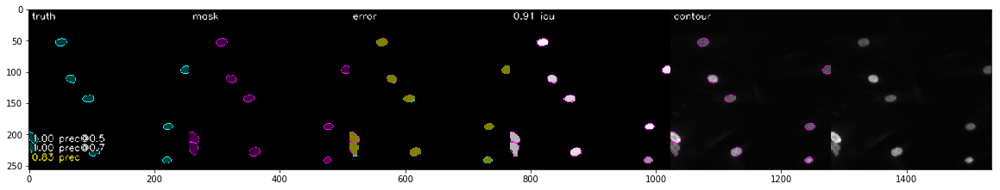

watershed:  0.12435897435897433
crf loss %f tensor(1.00000e-02 *
       1.0255, device='cuda:0')
1 =======================================


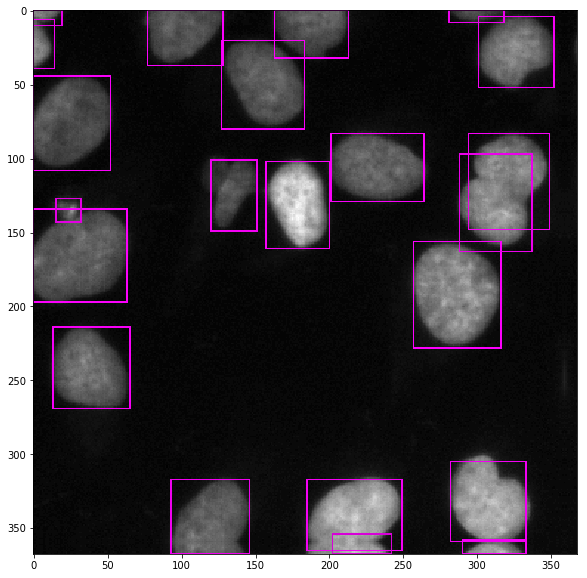

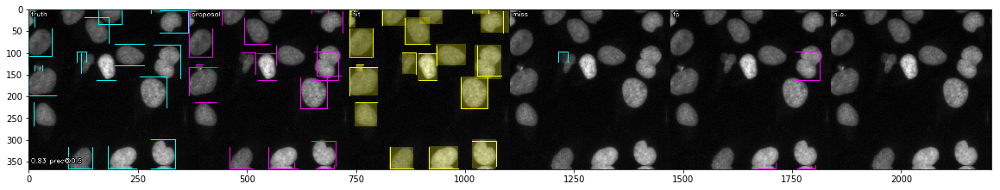

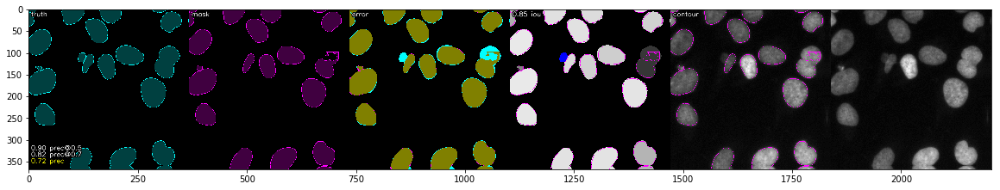

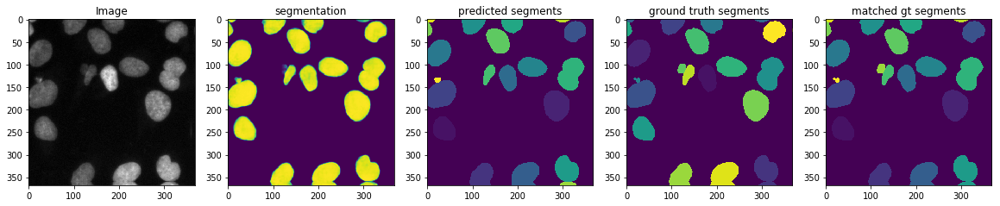

crf:  0.8110912076429319
mask-rcnn:  0.7224200919853094


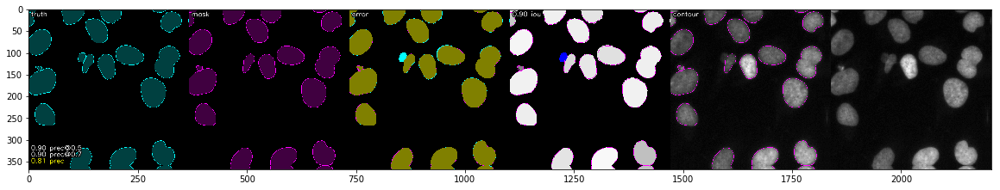

watershed:  0.5760952562277948
crf loss %f tensor(0.1149, device='cuda:0')
2 =======================================


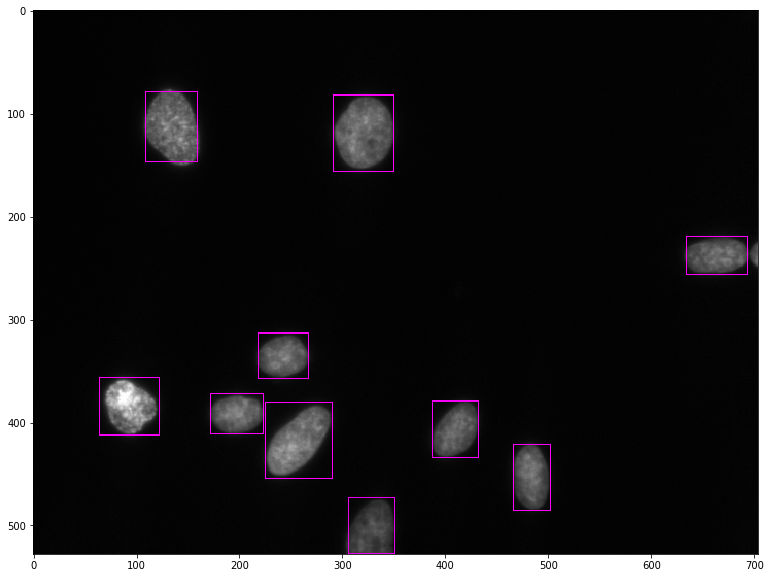

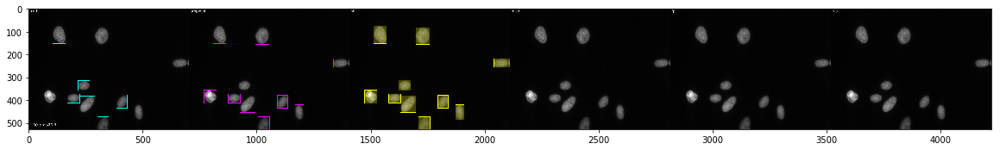

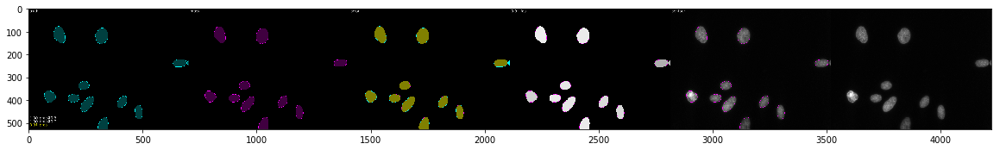

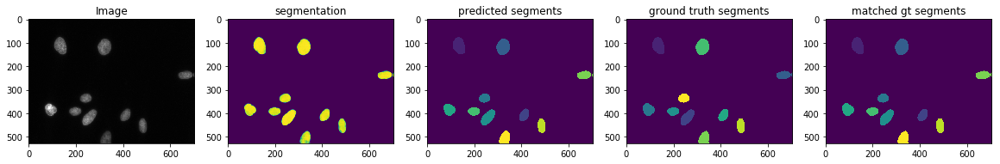

crf:  1.0
mask-rcnn:  0.9064935064935066


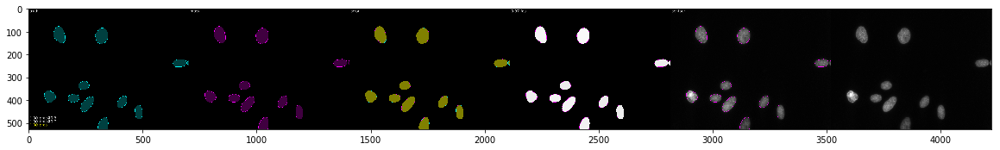

watershed:  0.5289529914529914
crf loss %f tensor(1.00000e-02 *
       1.0896, device='cuda:0')
3 =======================================


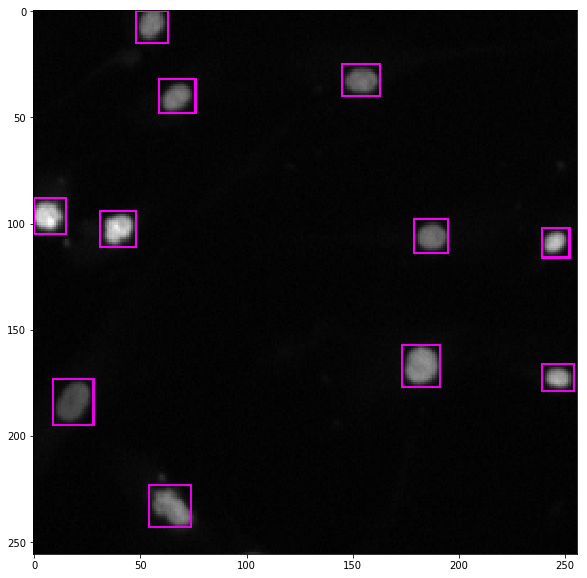

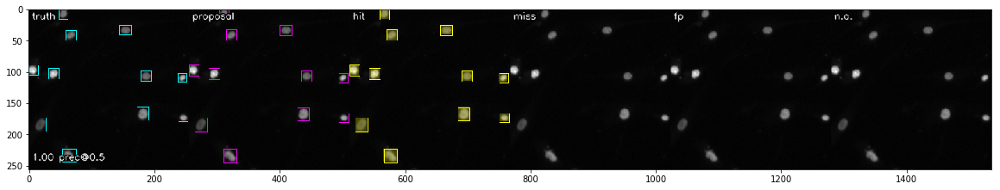

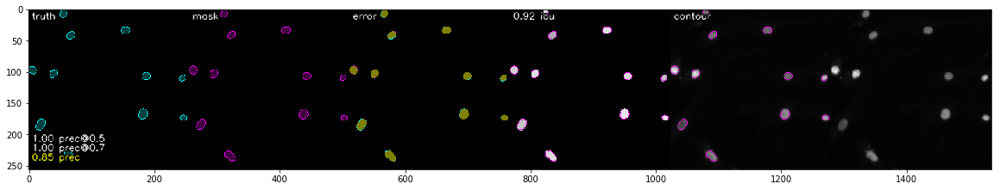

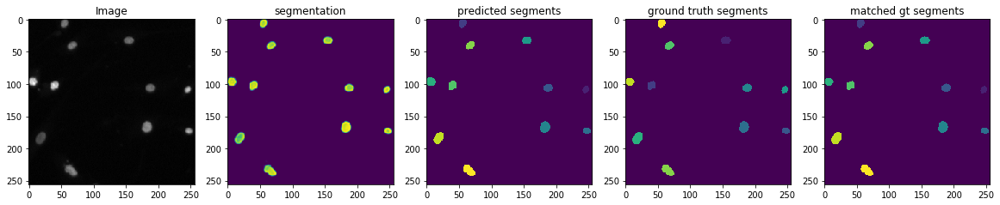

crf:  0.881975867269985
mask-rcnn:  0.8452380952380952


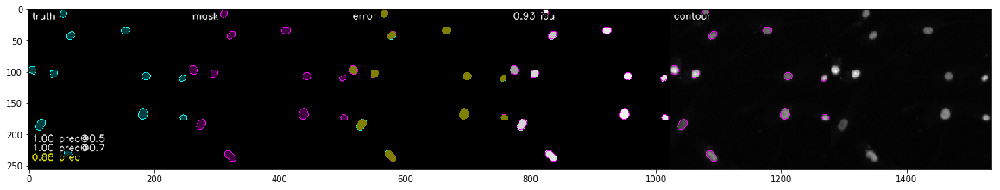

watershed:  0.22640639589168998
crf loss %f tensor(1.00000e-03 *
       9.6756, device='cuda:0')
4 =======================================


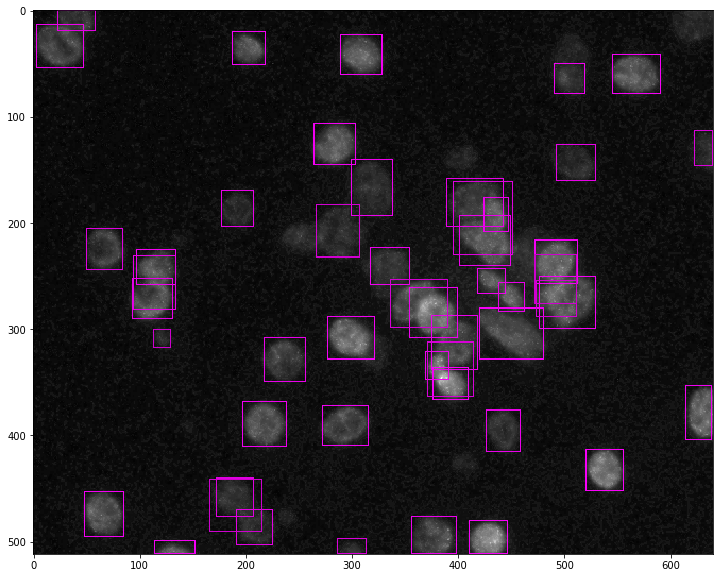

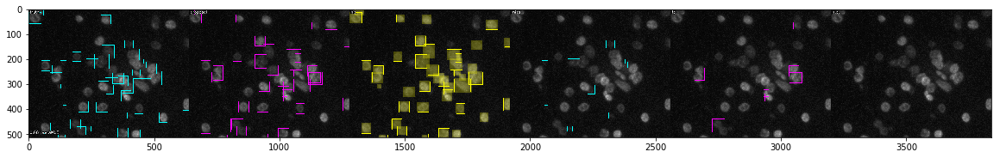

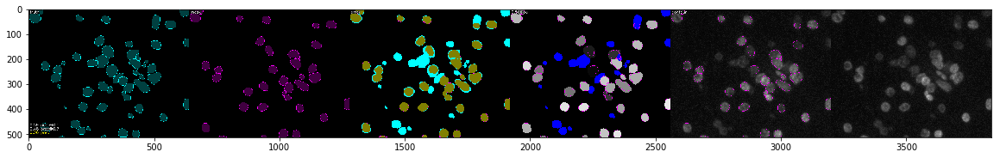

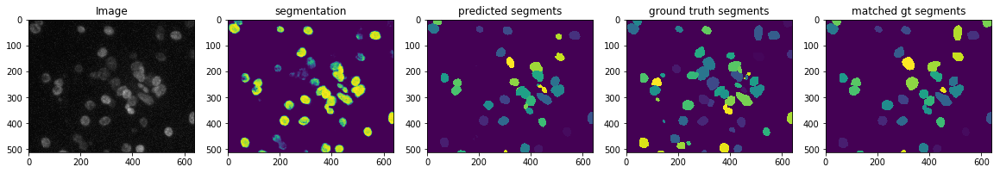

crf:  0.33033884206196296
mask-rcnn:  0.3632567426079313


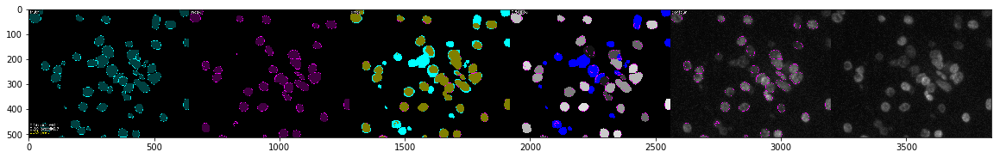

watershed:  0.15694711315020665
crf loss %f tensor(0.2475, device='cuda:0')
5 =======================================


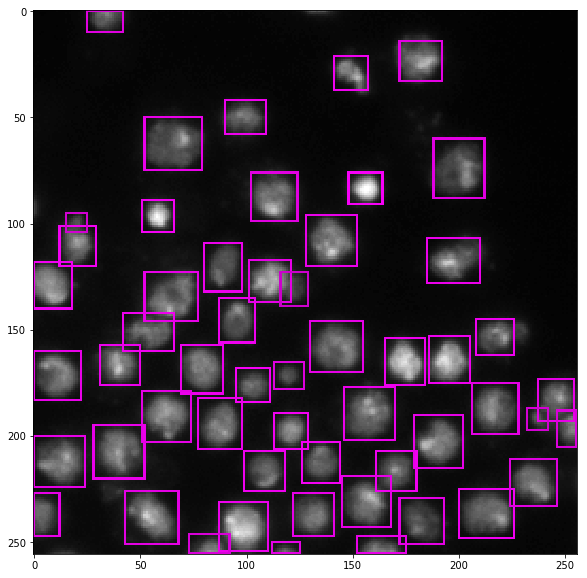

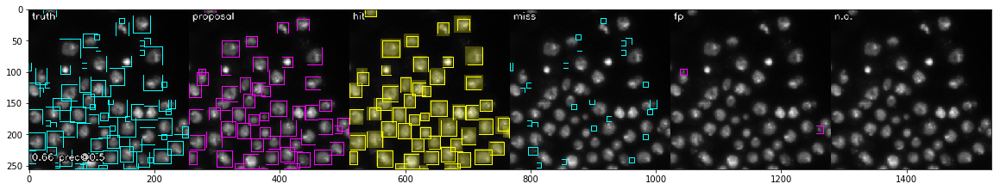

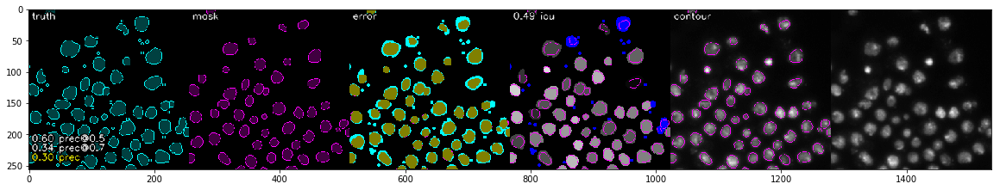

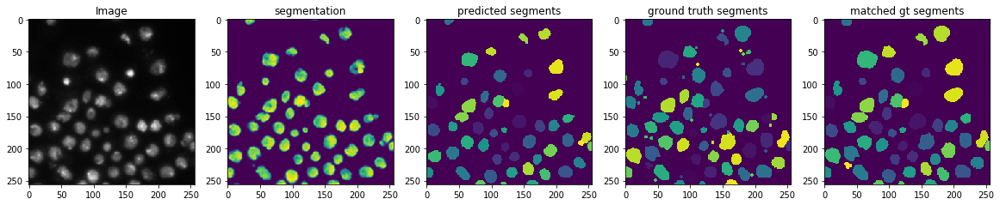

crf:  0.3515021626499074
mask-rcnn:  0.30134478218223765


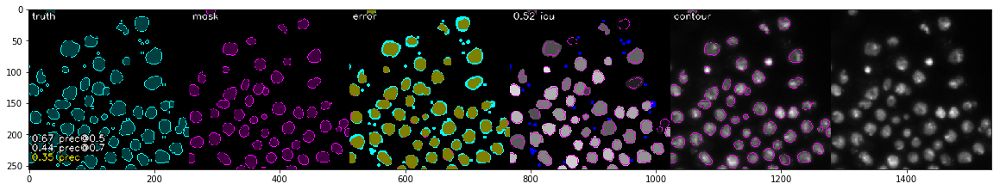

watershed:  0.056820362808751204
crf loss %f tensor(0.4431, device='cuda:0')
6 =======================================


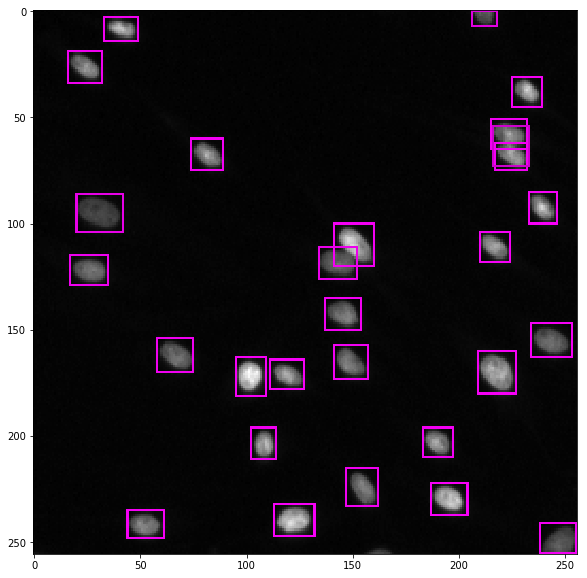

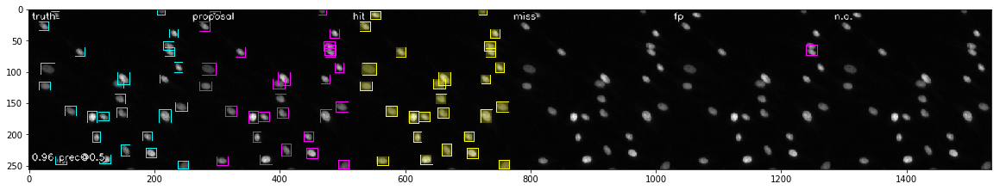

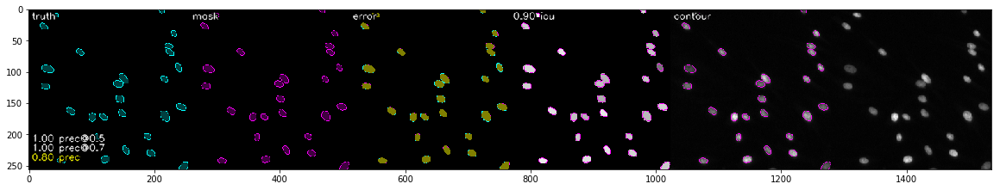

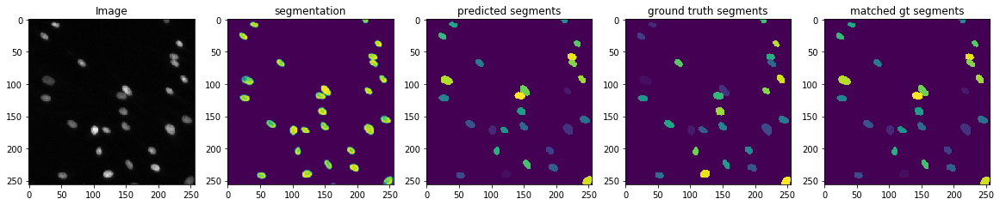

crf:  0.8336693025667617
mask-rcnn:  0.8022857142857143


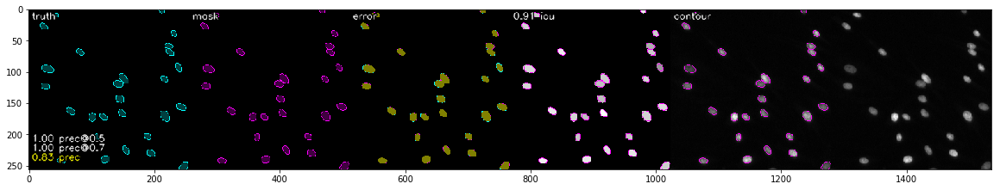

watershed:  0.05609061439825197
crf loss %f tensor(1.00000e-02 *
       3.8192, device='cuda:0')
7 =======================================


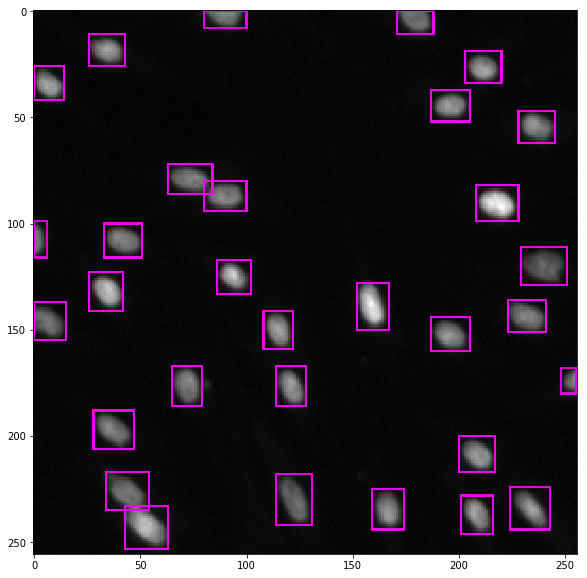

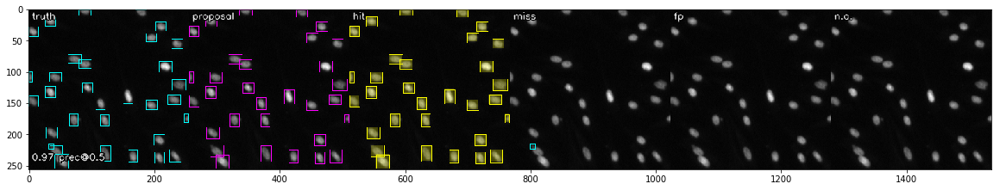

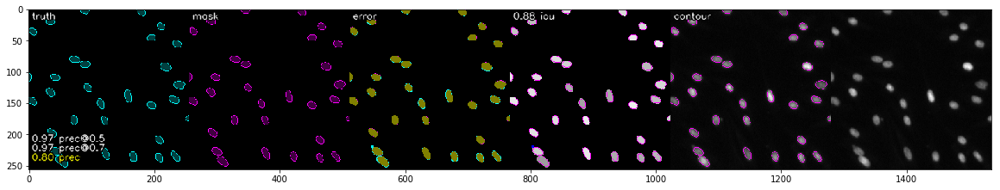

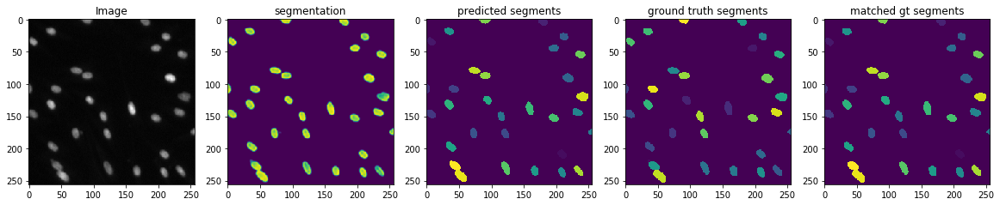

crf:  0.8241664084712401
mask-rcnn:  0.8009524173806609


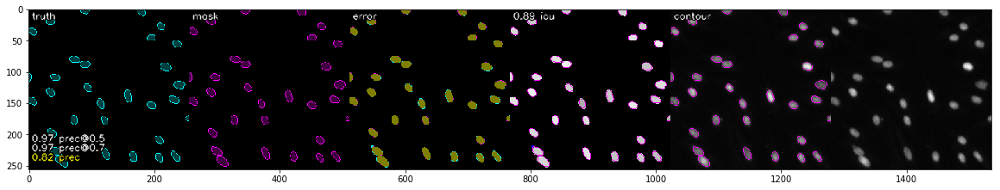

watershed:  0.2184204201595506
crf loss %f tensor(1.00000e-02 *
       5.6321, device='cuda:0')
8 =======================================


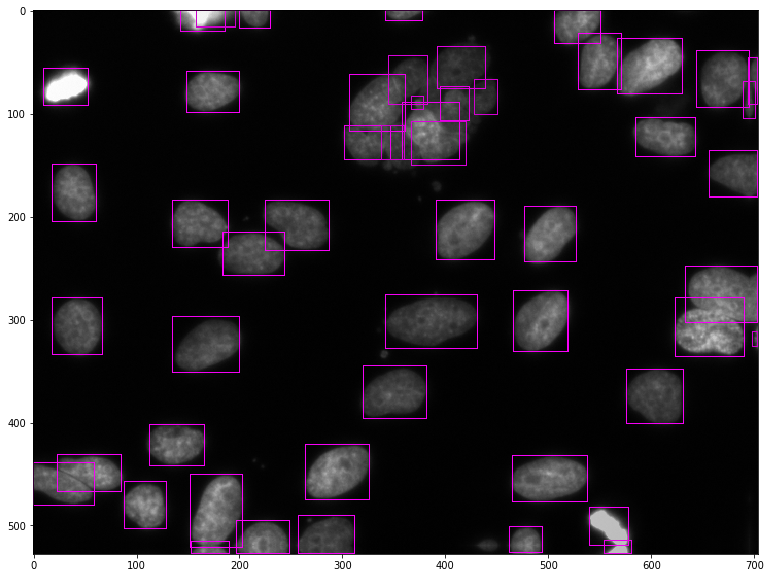

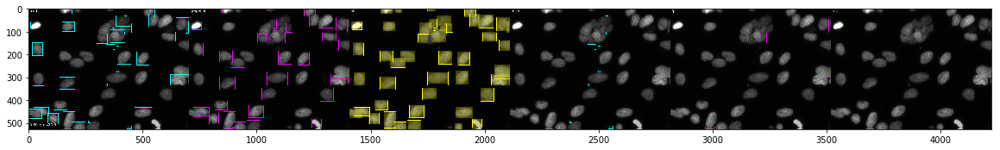

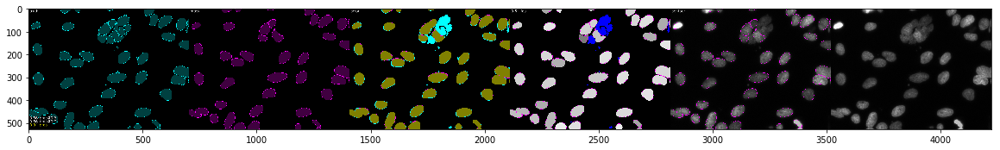

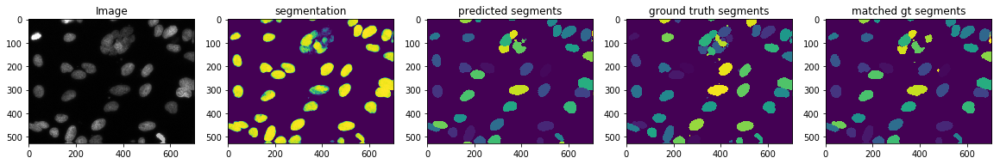

crf:  0.5441866946078849
mask-rcnn:  0.5400242197318811


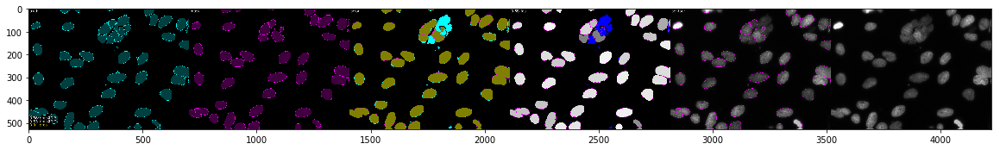

watershed:  0.40183608329340126
crf loss %f tensor(0.1976, device='cuda:0')
9 =======================================


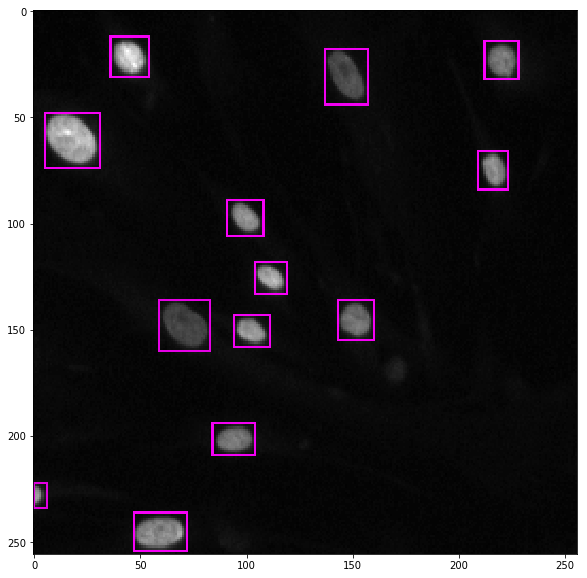

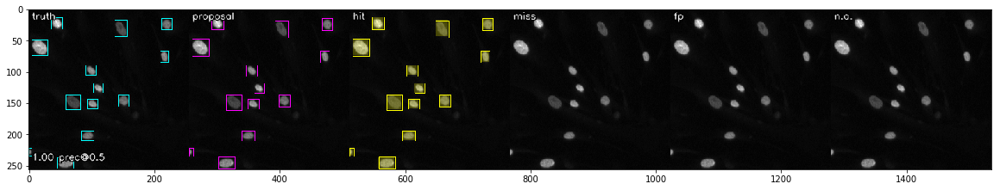

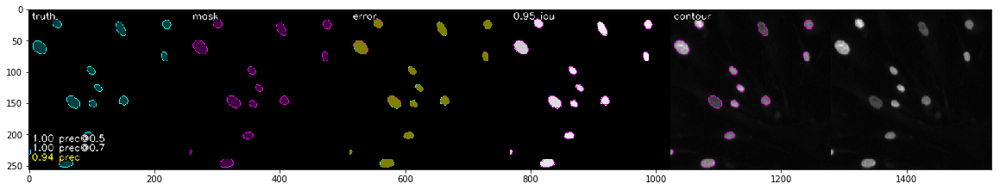

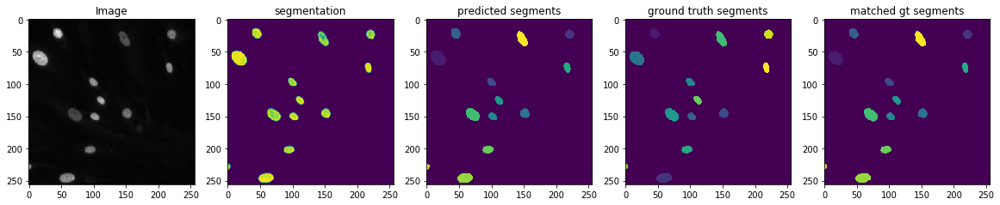

crf:  0.8782142857142858
mask-rcnn:  0.9444444444444444


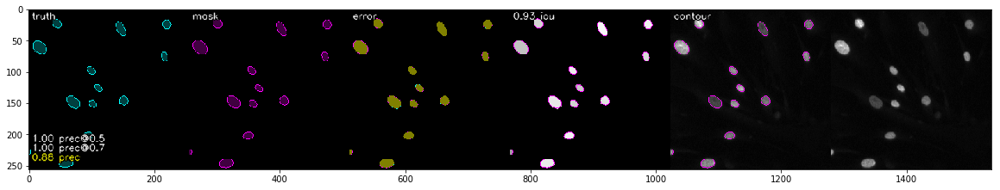

watershed:  0.34710432498358196
crf loss %f tensor(1.00000e-02 *
       1.4623, device='cuda:0')
10 =======================================


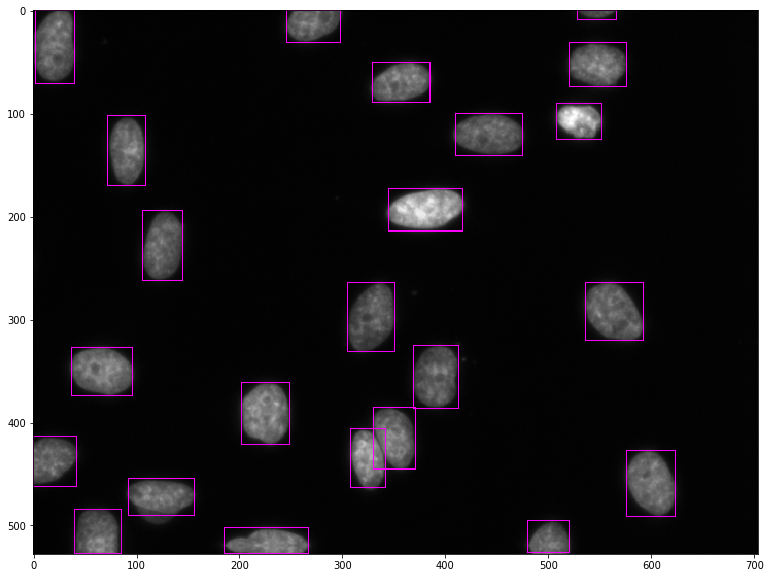

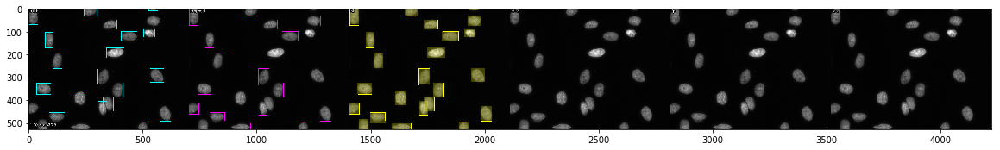

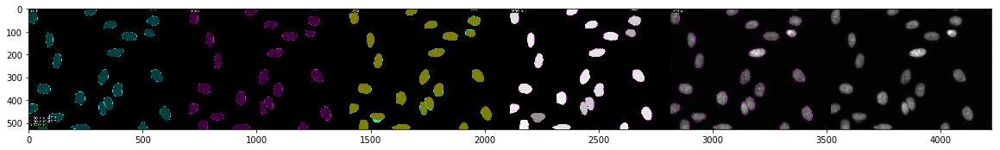

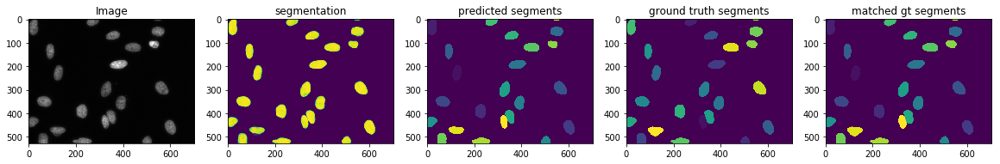

crf:  0.9342873563218392
mask-rcnn:  0.8703613613613614


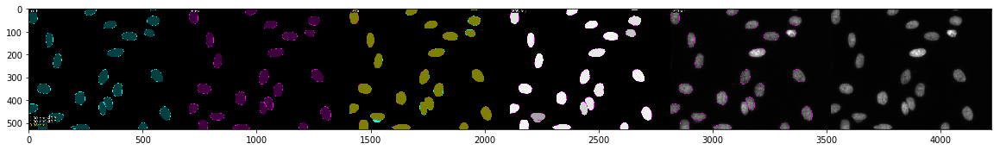

watershed:  0.5950625236832133
crf loss %f tensor(1.00000e-02 *
       4.3922, device='cuda:0')
11 =======================================


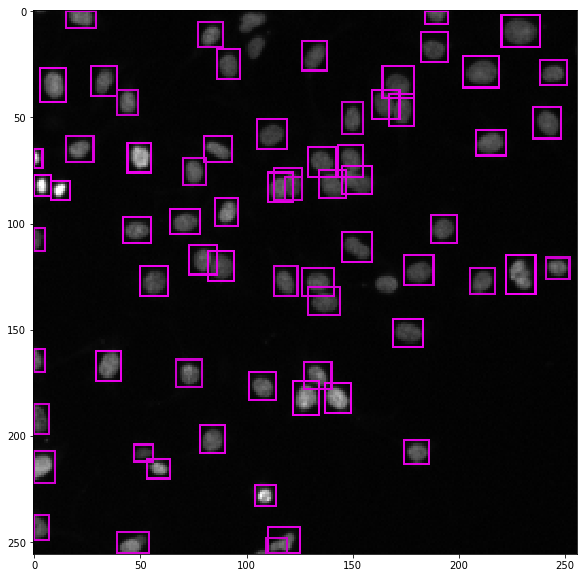

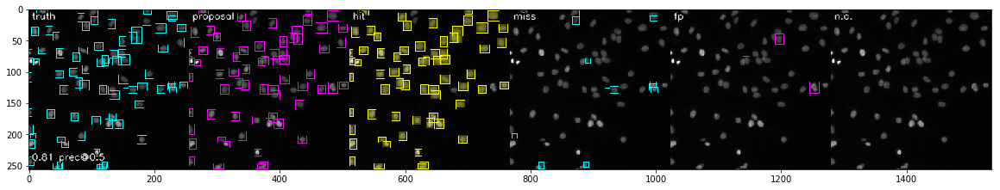

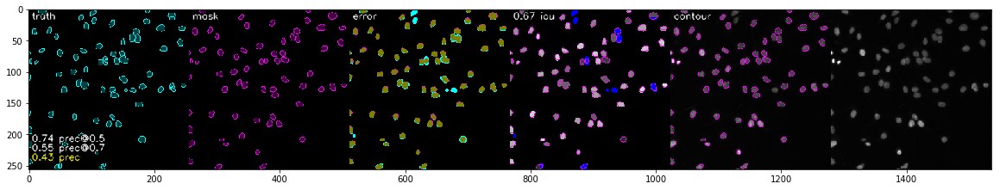

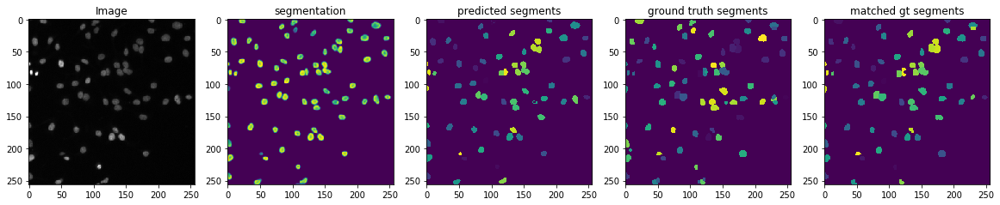

crf:  0.4146057176691218
mask-rcnn:  0.433747056565985


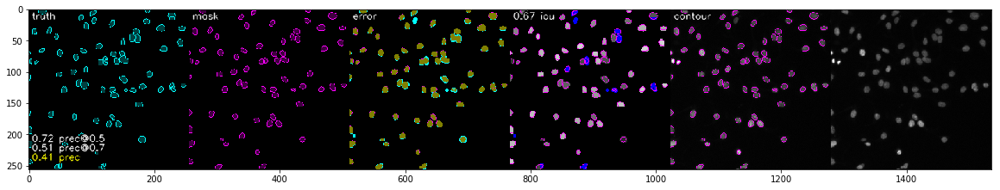

watershed:  0.0
crf loss %f tensor(0.1804, device='cuda:0')
12 =======================================


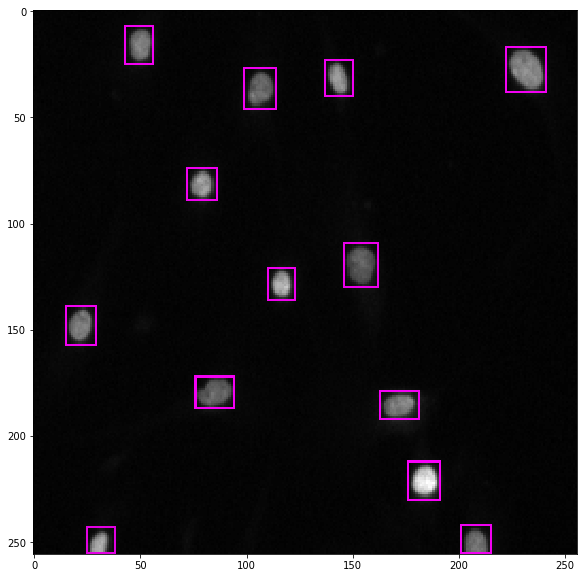

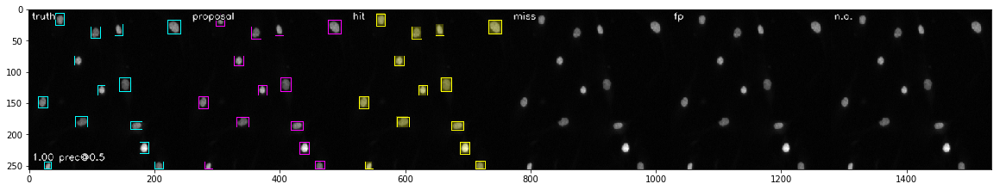

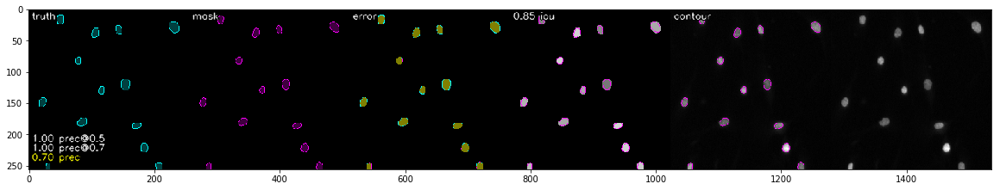

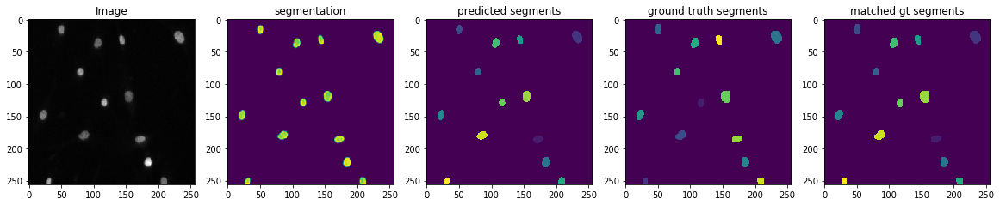

crf:  0.7374132261600291
mask-rcnn:  0.7032382091592617


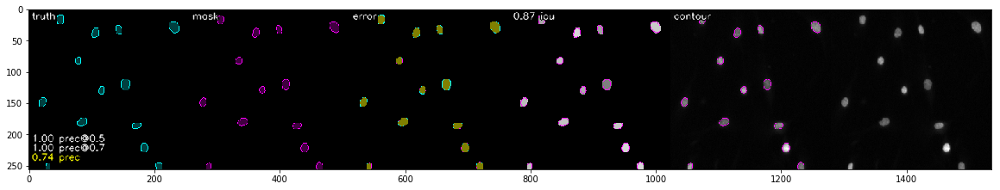

watershed:  0.10902132782937737
crf loss %f tensor(1.00000e-02 *
       1.8110, device='cuda:0')
13 =======================================


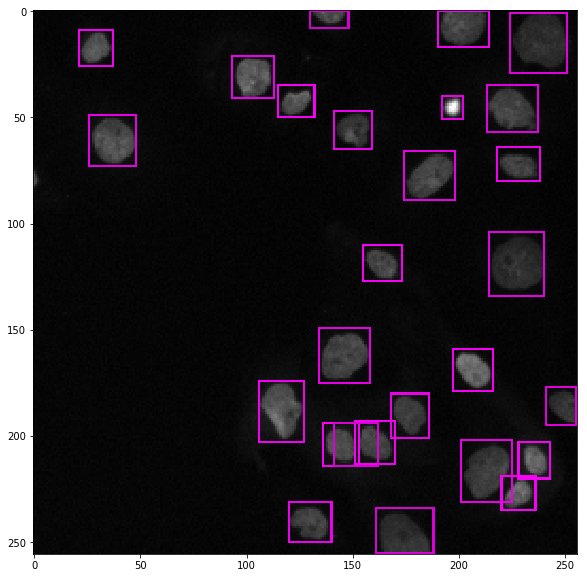

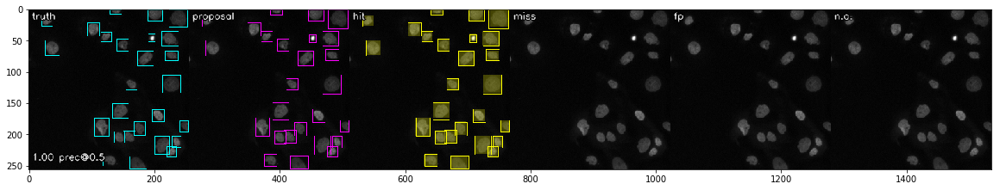

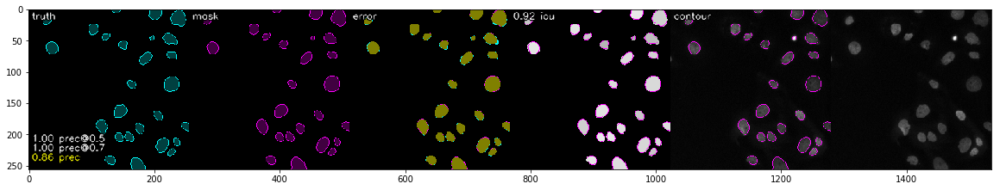

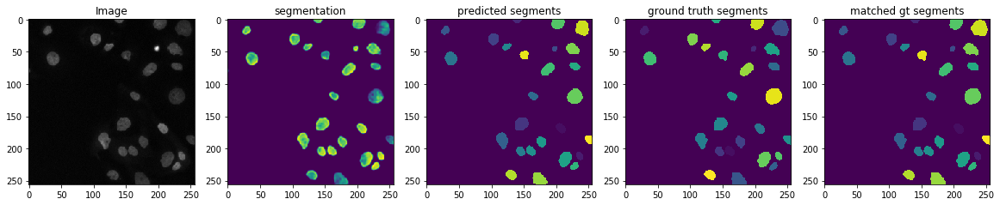

crf:  0.8609427609427609
mask-rcnn:  0.8608066480406906


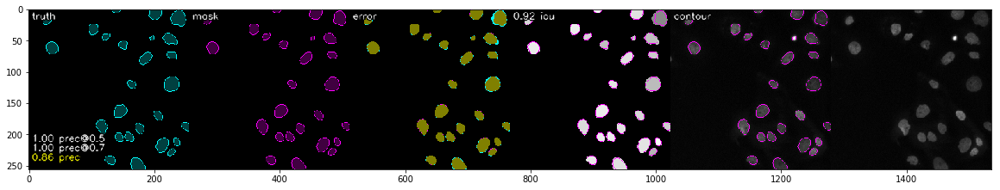

watershed:  0.010714285714285714
crf loss %f tensor(1.00000e-02 *
       5.5025, device='cuda:0')
14 =======================================


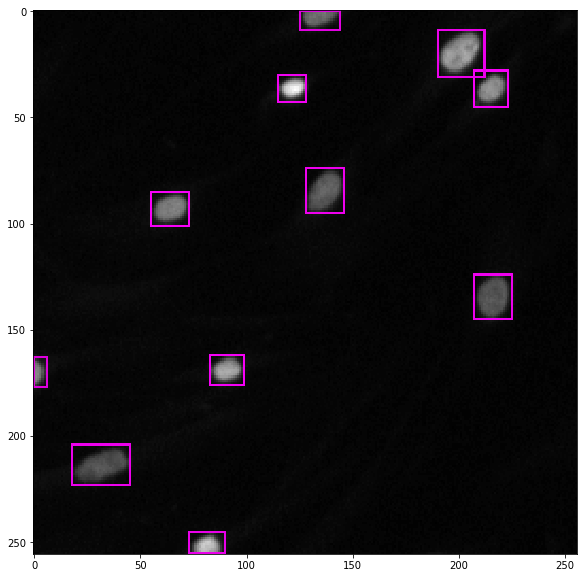

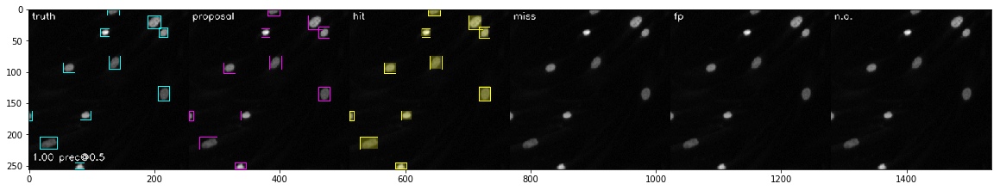

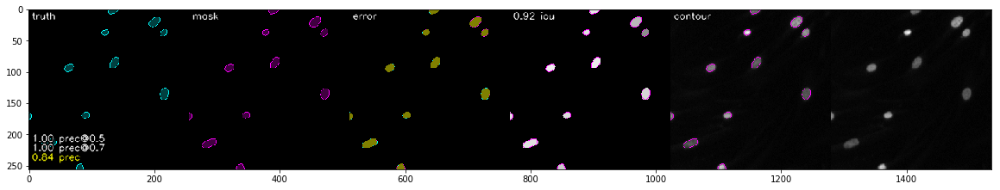

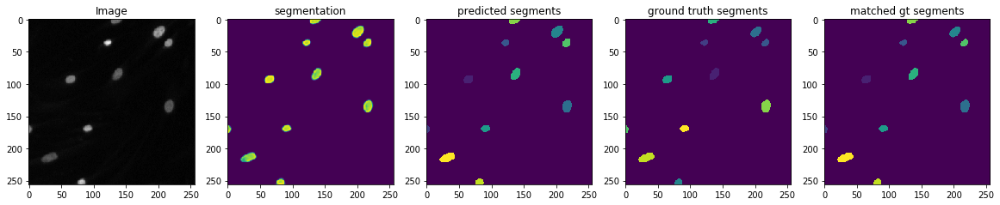

crf:  0.7956196581196581
mask-rcnn:  0.8395989974937341


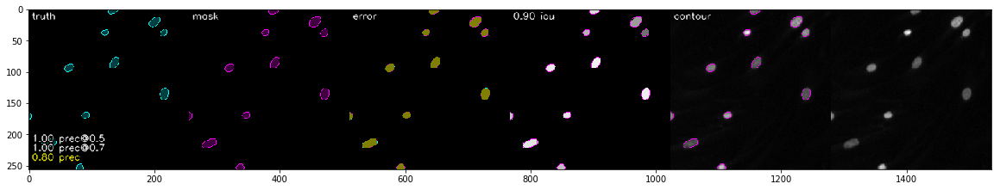

watershed:  0.26587373410902826
crf loss %f tensor(1.00000e-02 *
       1.2680, device='cuda:0')
15 =======================================


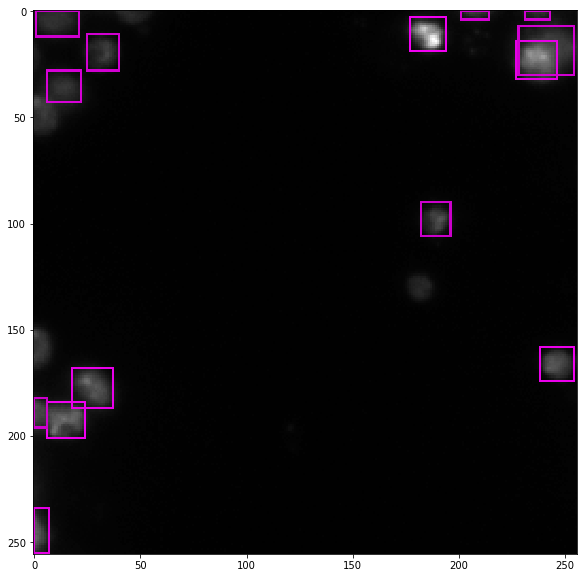

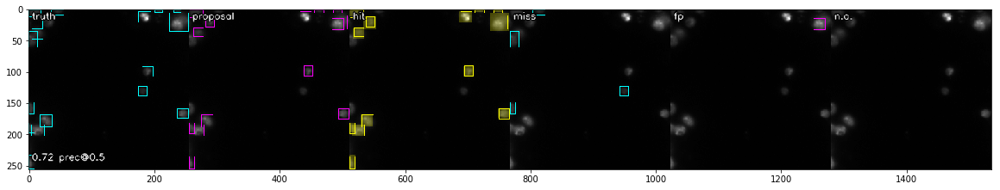

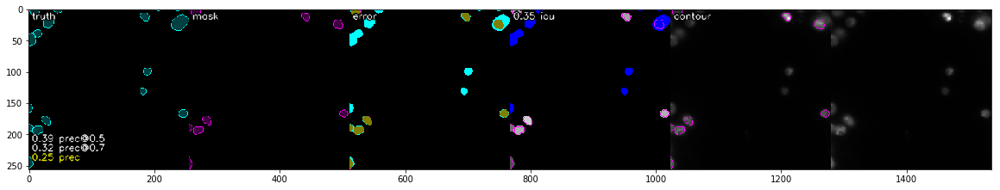

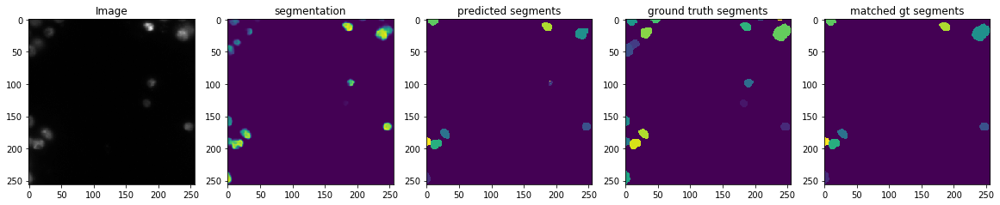

crf:  0.2931114551083592
mask-rcnn:  0.2499968217645563


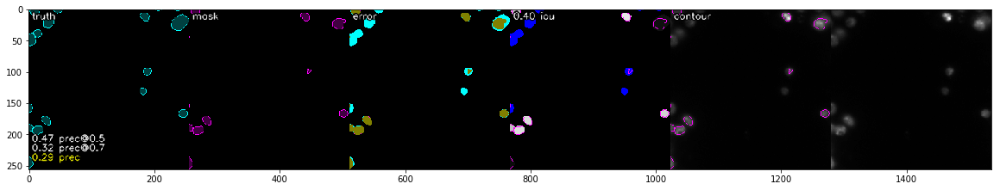

watershed:  0.025
crf loss %f tensor(1.00000e-02 *
       2.9063, device='cuda:0')
16 =======================================


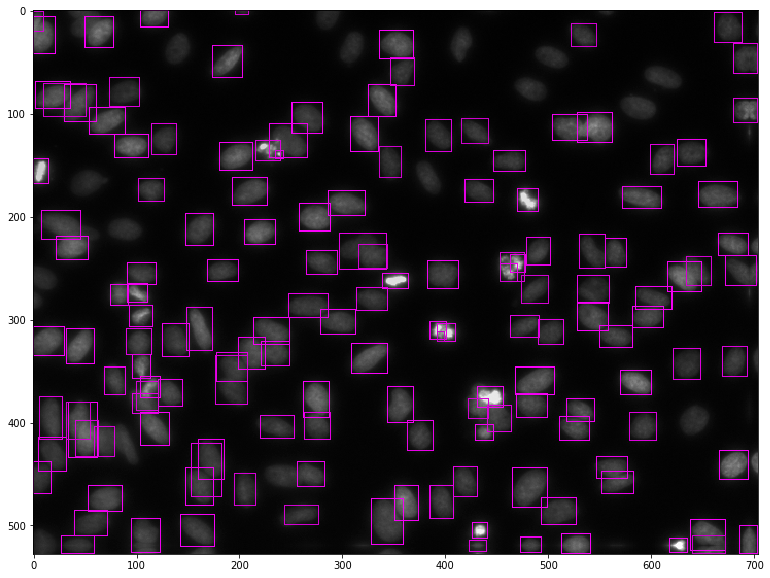

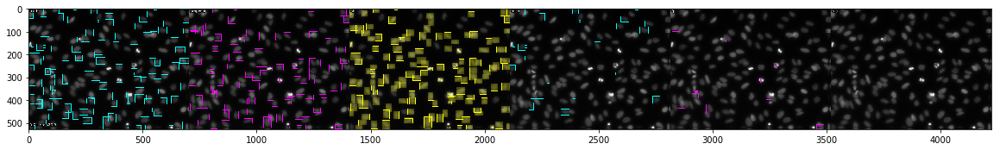

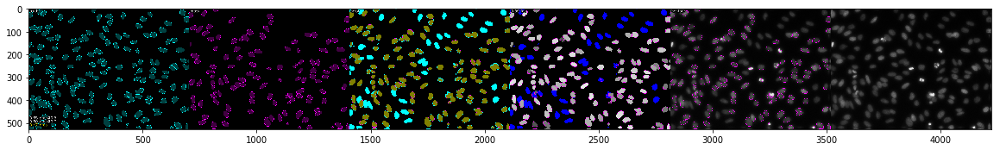

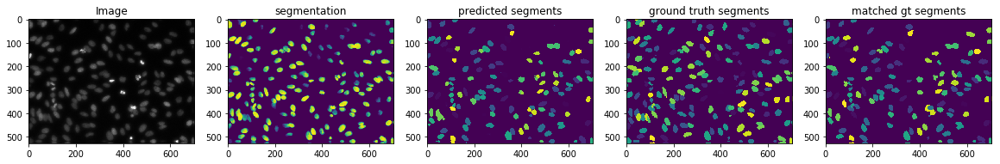

crf:  0.4340104201870674
mask-rcnn:  0.4716241546351565


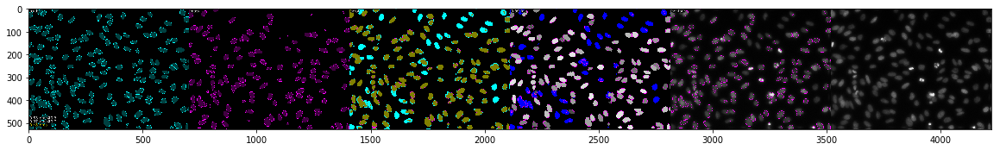

watershed:  0.22330774583463353
crf loss %f tensor(0.5012, device='cuda:0')
17 =======================================


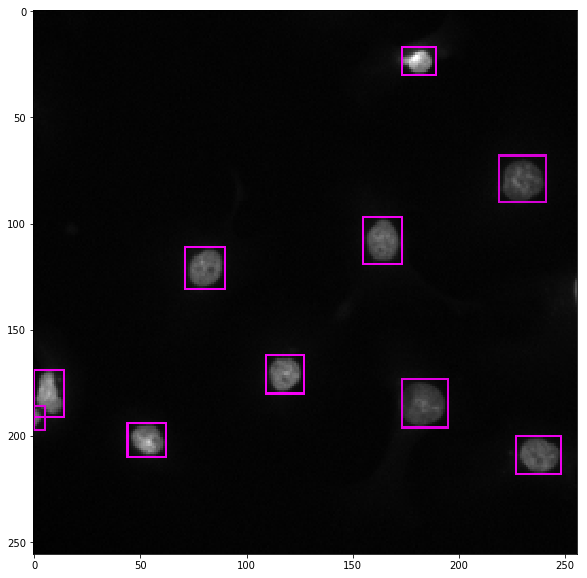

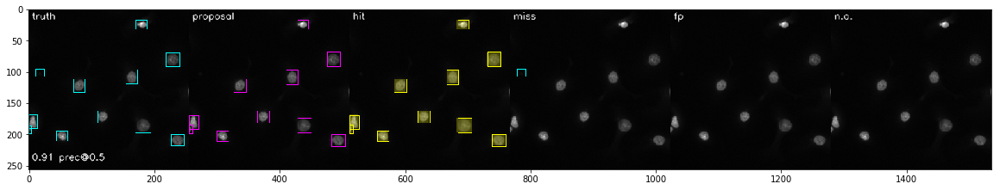

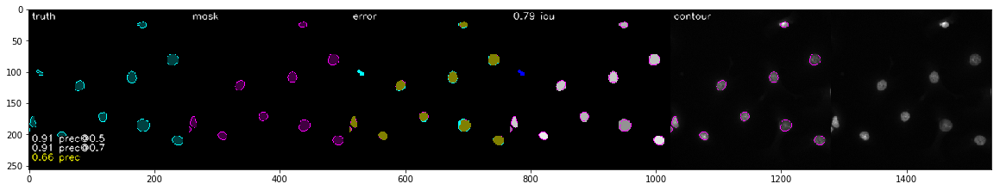

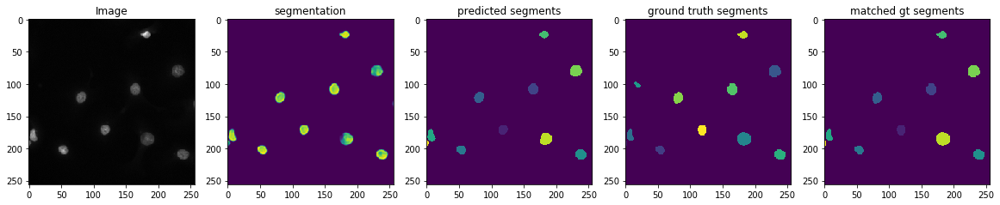

crf:  0.6412121212121212
mask-rcnn:  0.6566102318733897


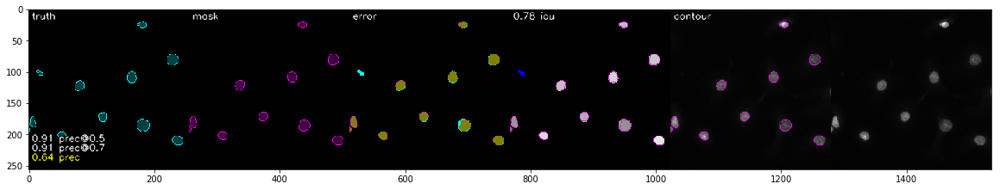

watershed:  0.03571428571428571
crf loss %f tensor(1.00000e-02 *
       1.5685, device='cuda:0')
18 =======================================


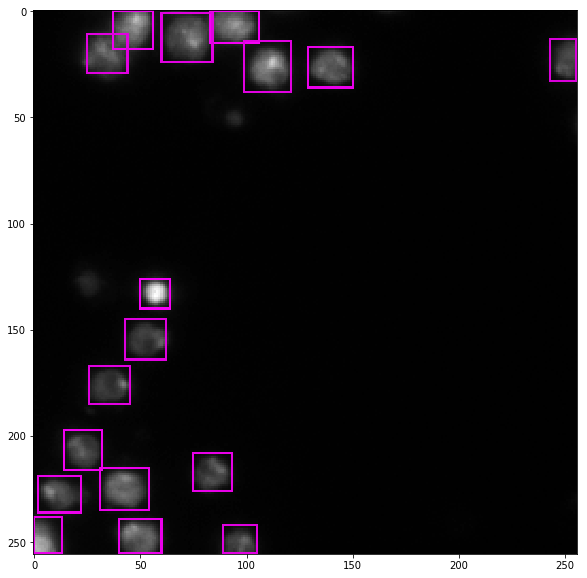

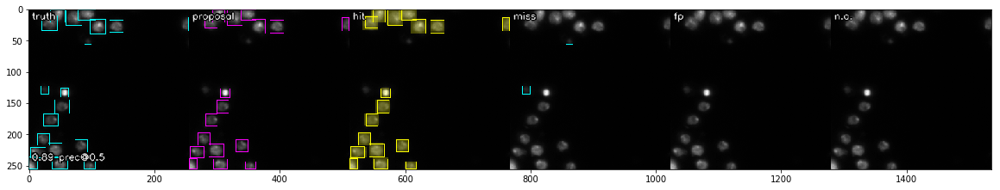

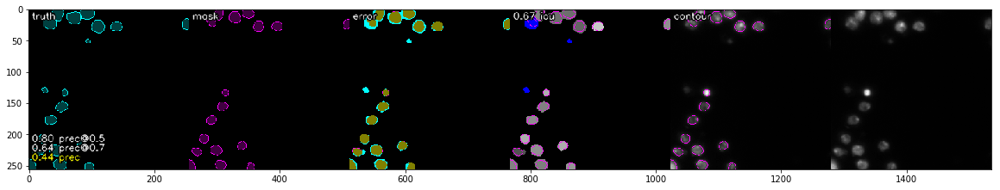

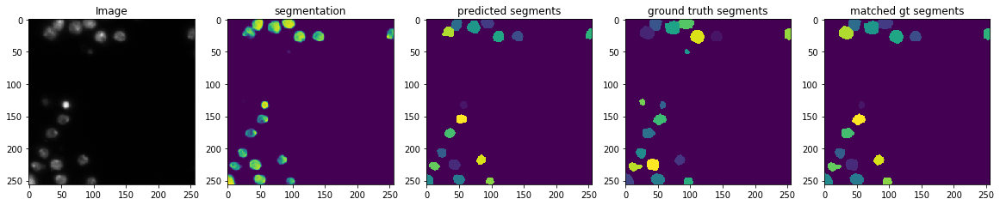

crf:  0.5062235799393535
mask-rcnn:  0.4429935064935065


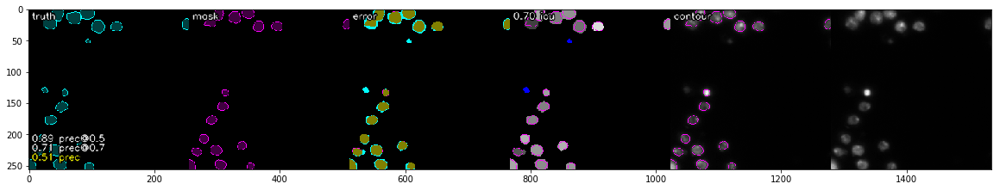

watershed:  0.05340711462450594
crf loss %f tensor(1.00000e-02 *
       6.8598, device='cuda:0')
19 =======================================


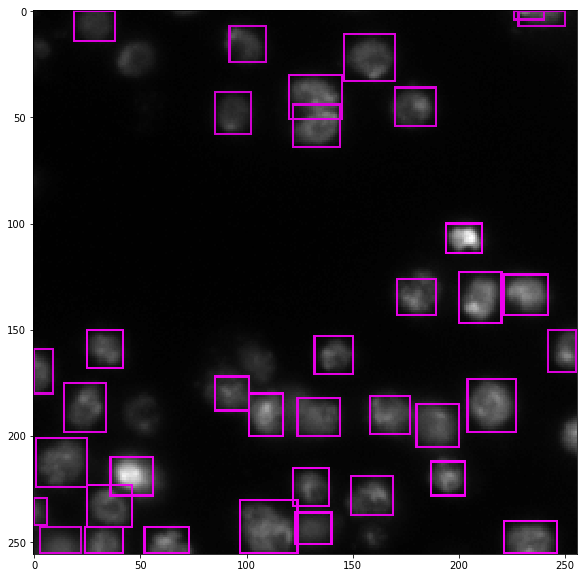

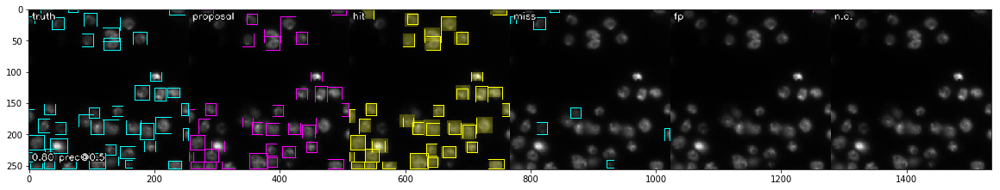

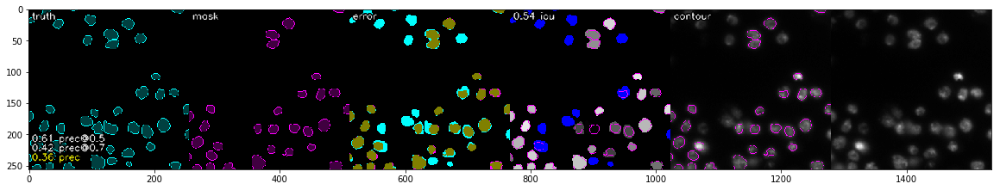

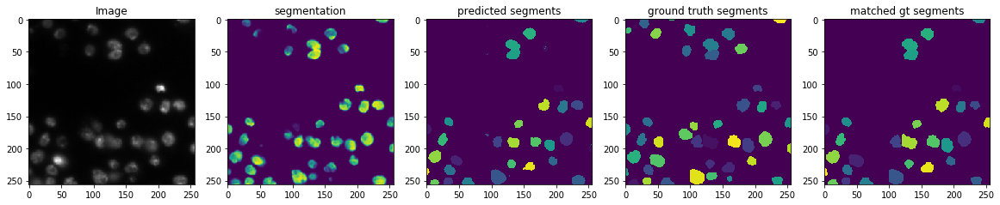

crf:  0.3898008781256751
mask-rcnn:  0.3638196572273891


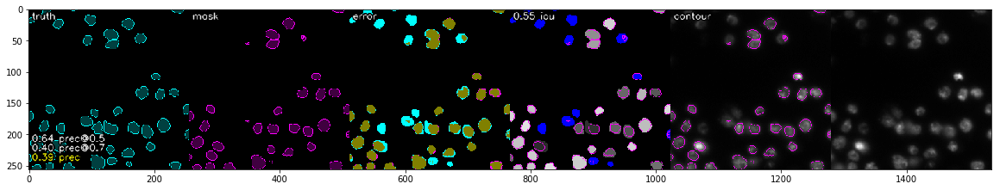

watershed:  0.03733163265306123
crf loss %f tensor(0.1686, device='cuda:0')
20 =======================================


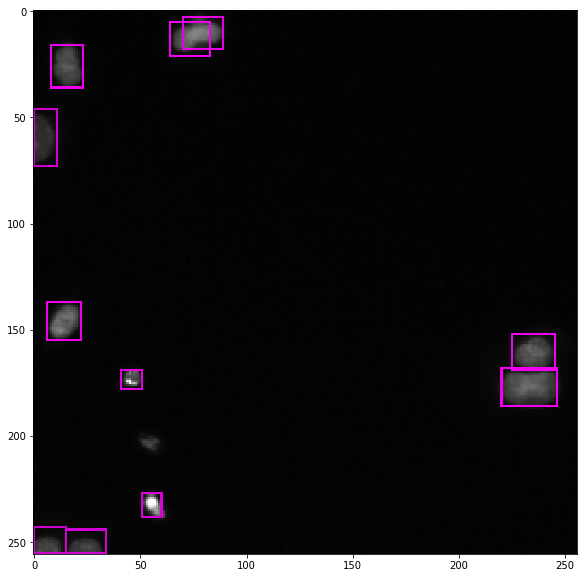

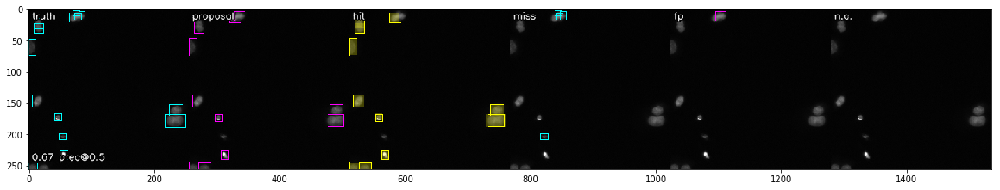

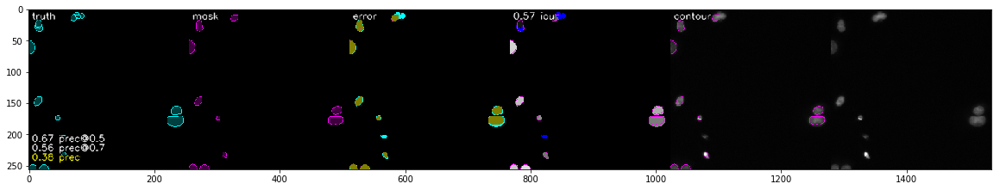

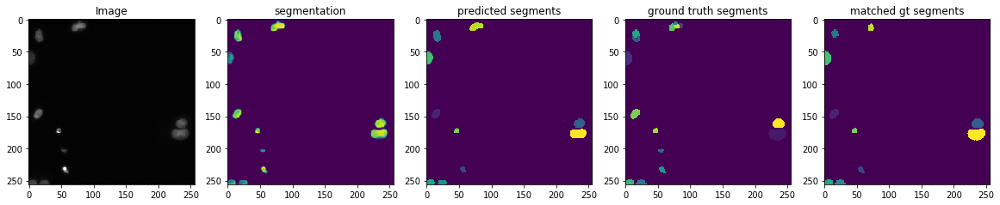

crf:  0.38148976982097194
mask-rcnn:  0.3759888852566198


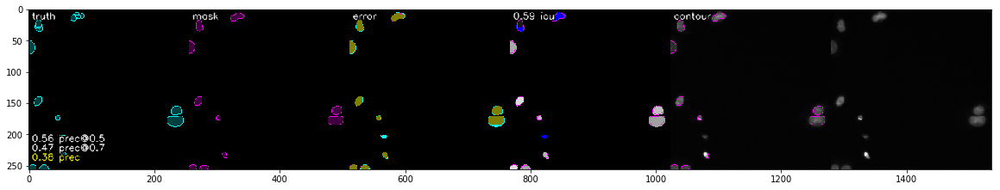

watershed:  0.0
crf loss %f tensor(1.00000e-02 *
       2.8659, device='cuda:0')
21 =======================================


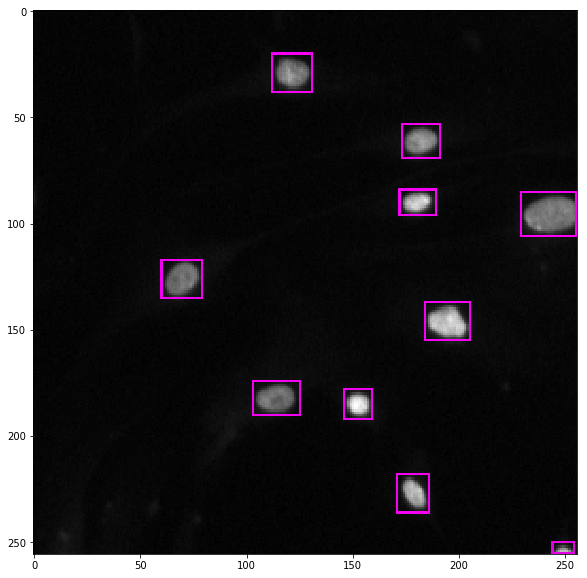

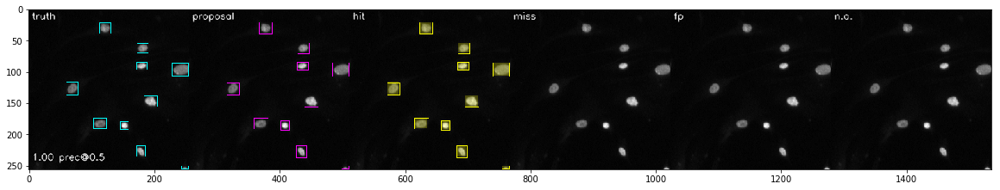

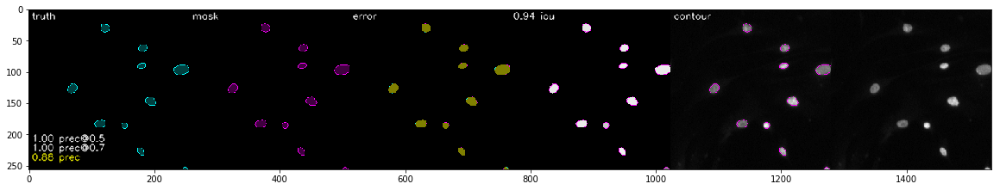

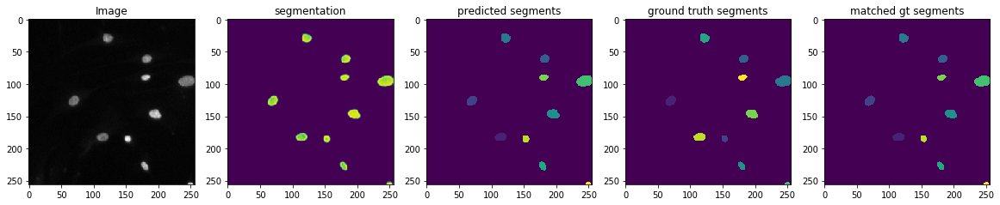

crf:  0.8496753246753247
mask-rcnn:  0.8841491841491841


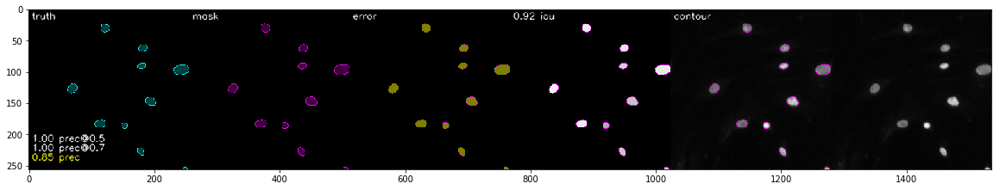

watershed:  0.19633699633699636
crf loss %f tensor(1.00000e-03 *
       8.1979, device='cuda:0')
22 =======================================


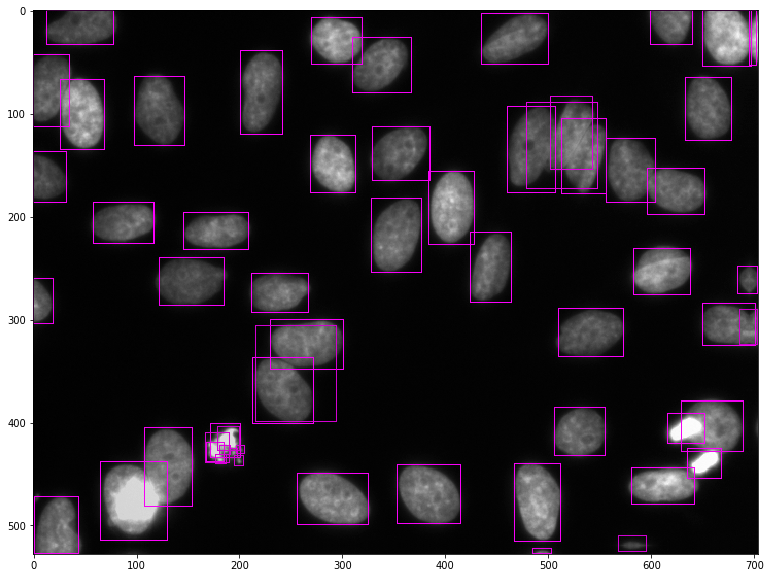

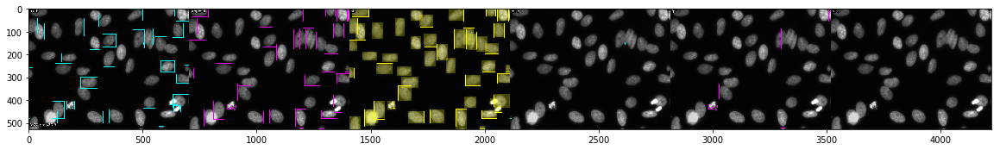

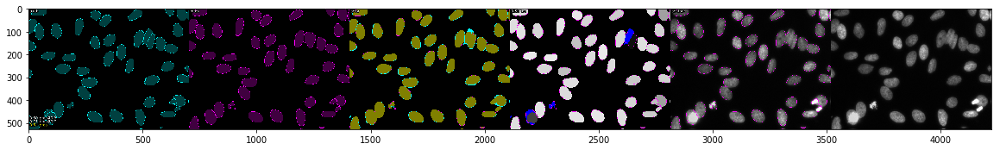

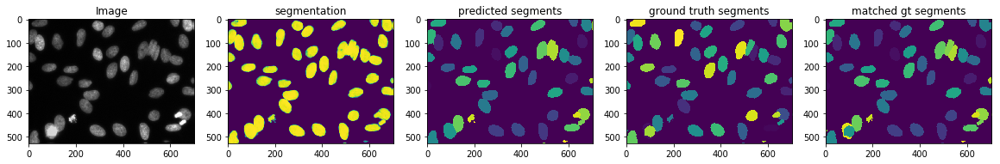

crf:  0.6537413971085146
mask-rcnn:  0.6430839098259039


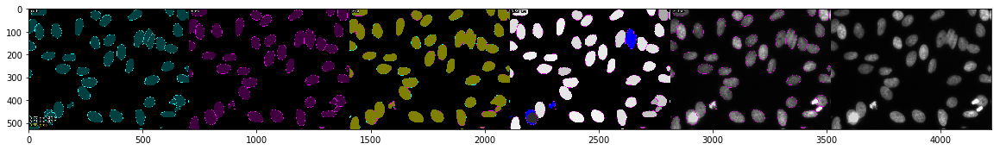

watershed:  0.4563732076454632
crf loss %f tensor(0.2358, device='cuda:0')
23 =======================================


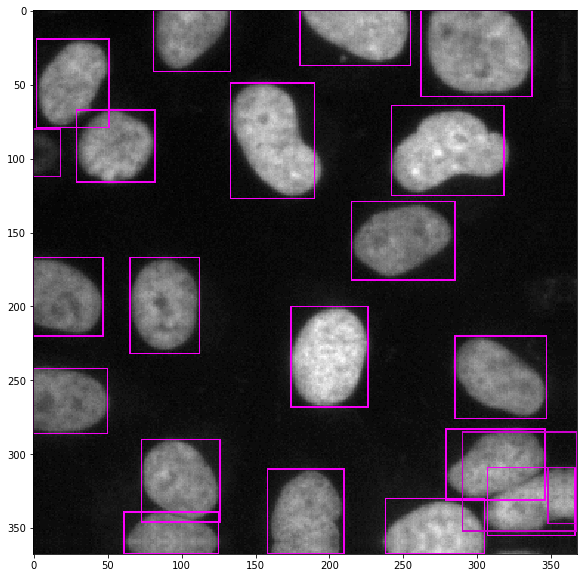

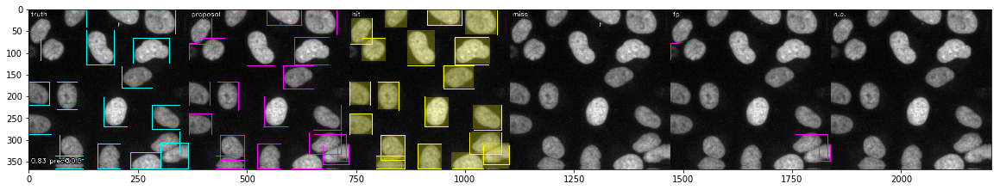

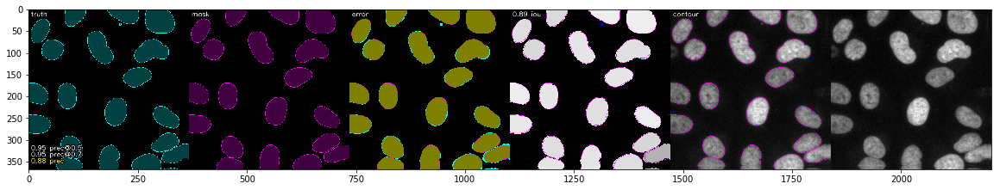

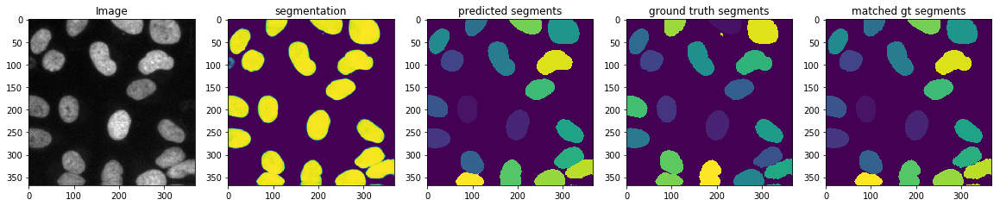

crf:  0.8994444444444445
mask-rcnn:  0.8757142857142858


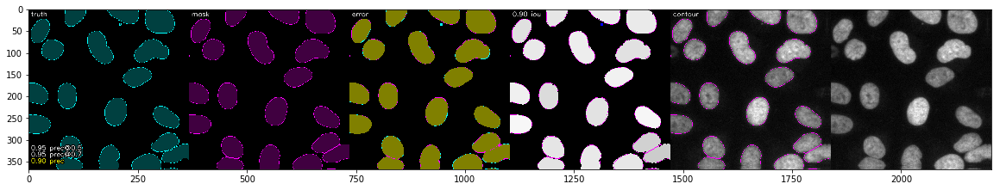

watershed:  0.5043659673659674
crf loss %f tensor(0.1168, device='cuda:0')
24 =======================================


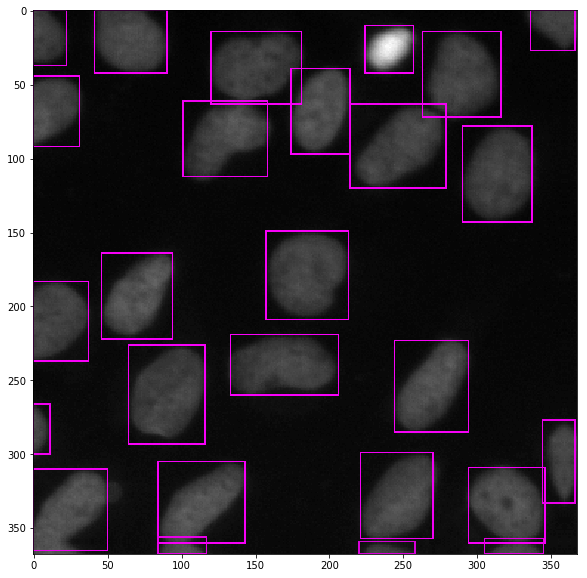

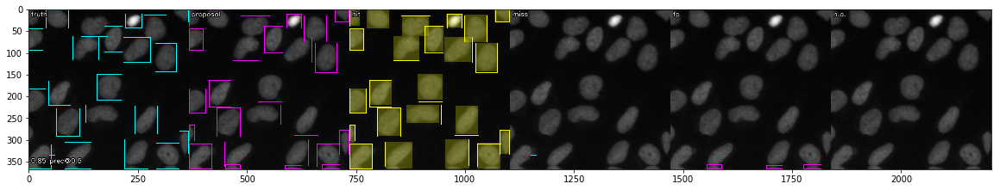

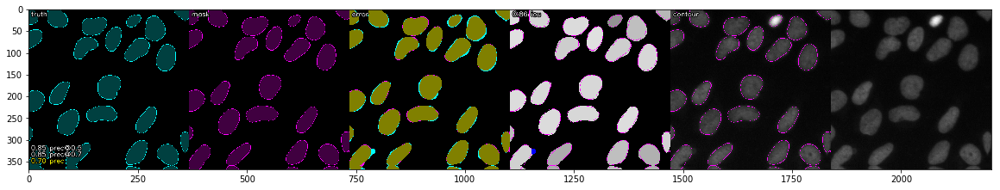

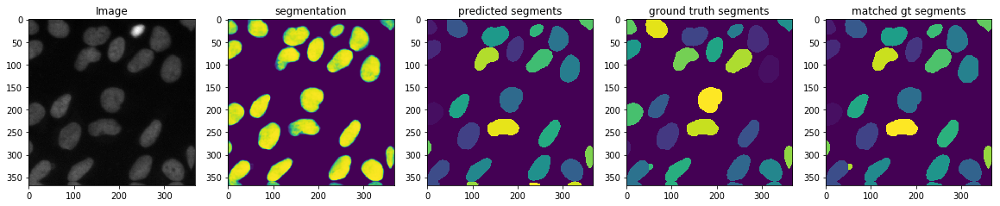

crf:  0.7355629120335003
mask-rcnn:  0.7034080298786182


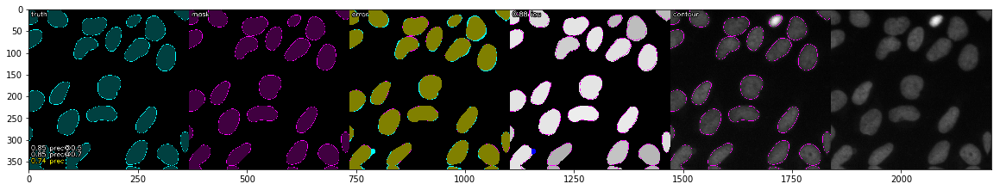

watershed:  0.5310073581630238
crf loss %f tensor(0.1496, device='cuda:0')
25 =======================================


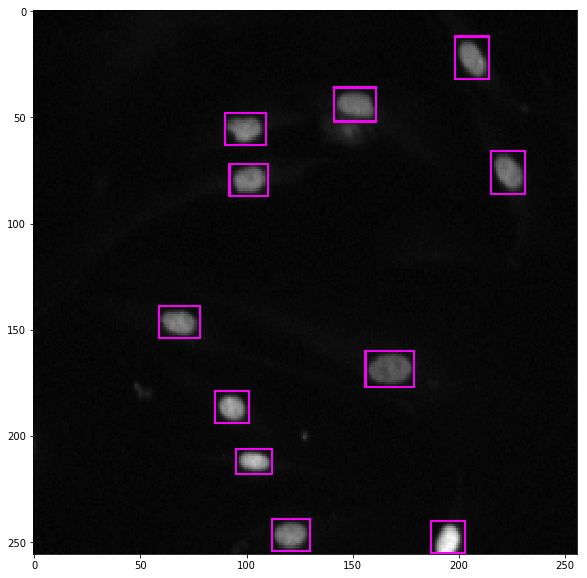

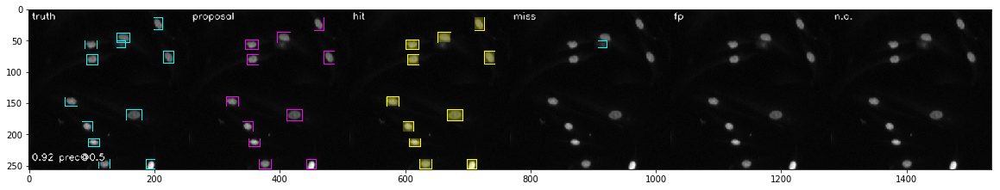

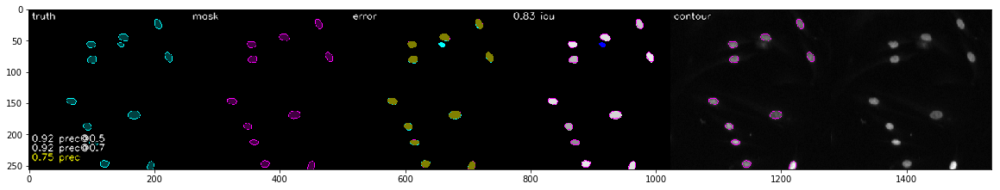

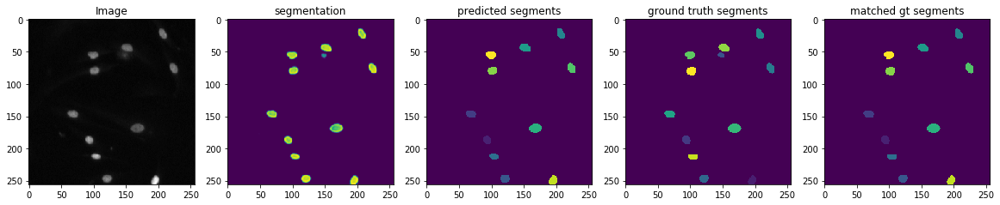

crf:  0.7929757085020243
mask-rcnn:  0.7499587912087913


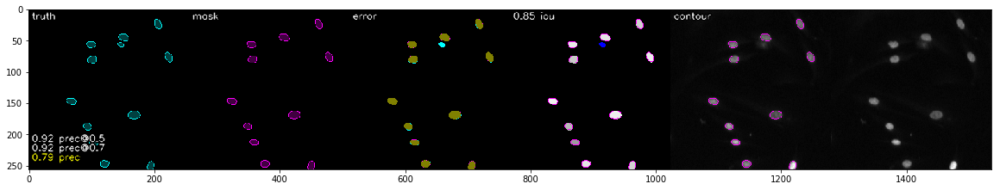

watershed:  0.17083333333333334
crf loss %f tensor(1.00000e-02 *
       1.1046, device='cuda:0')
26 =======================================


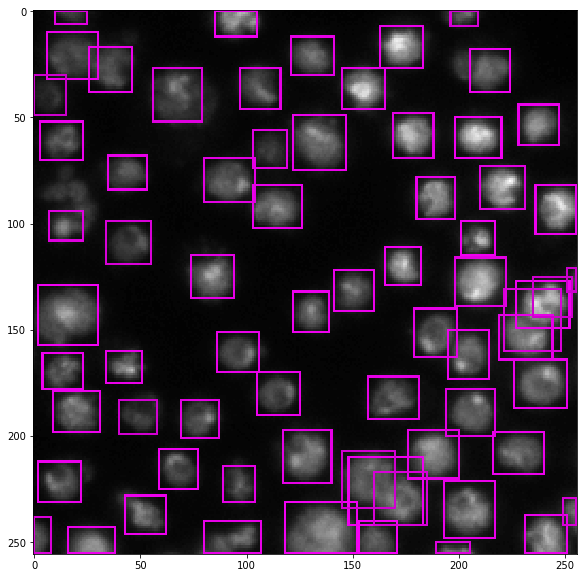

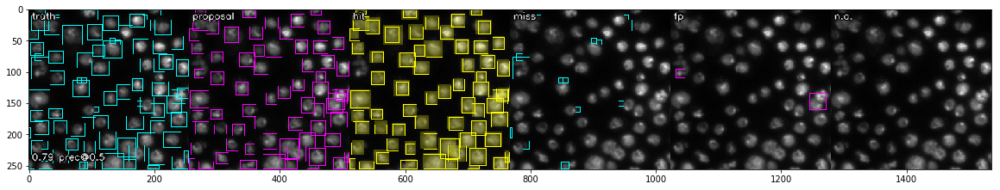

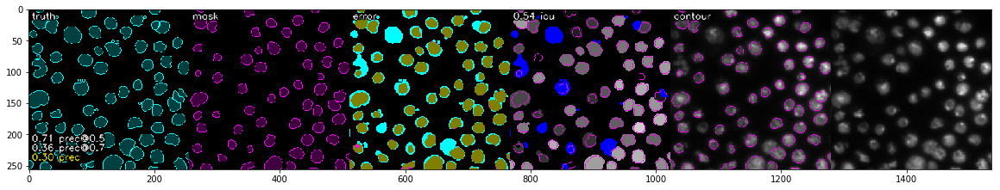

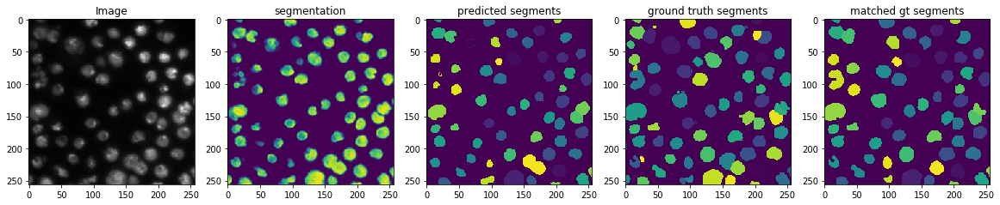

crf:  0.30948877001613373
mask-rcnn:  0.2980136895891542


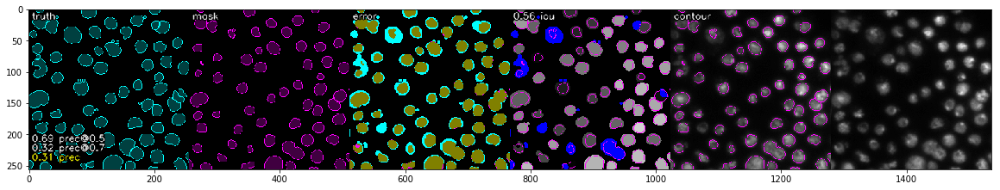

watershed:  0.05485499966650923
crf loss %f tensor(0.6536, device='cuda:0')
27 =======================================


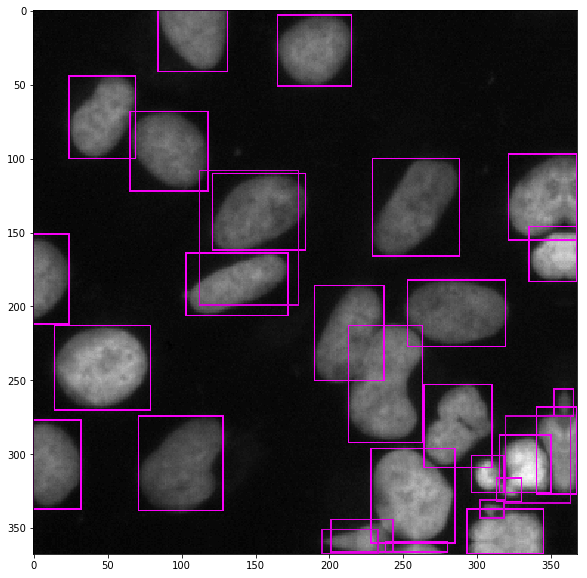

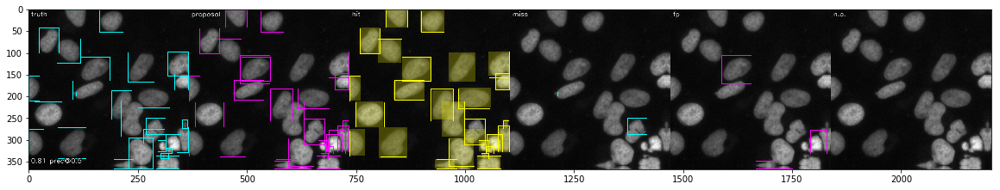

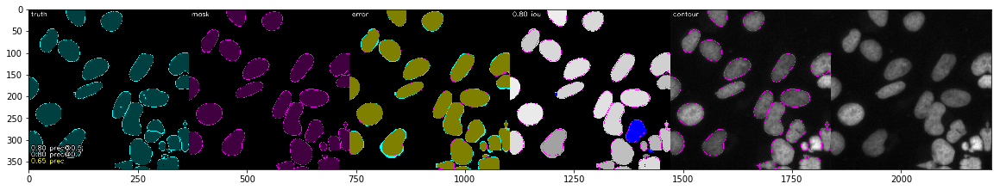

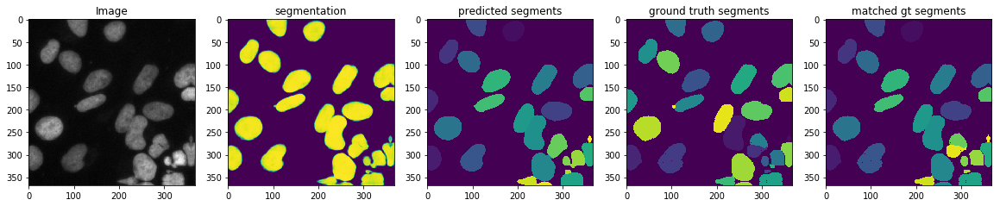

crf:  0.6679923599320884
mask-rcnn:  0.6480929791271347


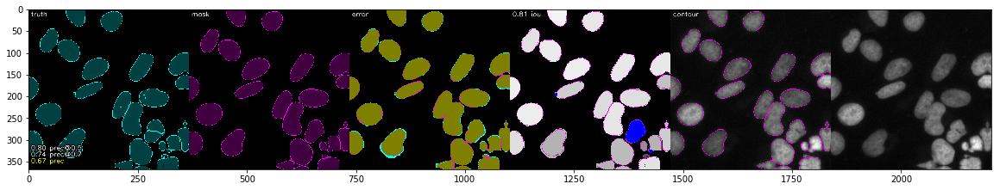

watershed:  0.4924355108048181
crf loss %f tensor(0.1982, device='cuda:0')
28 =======================================


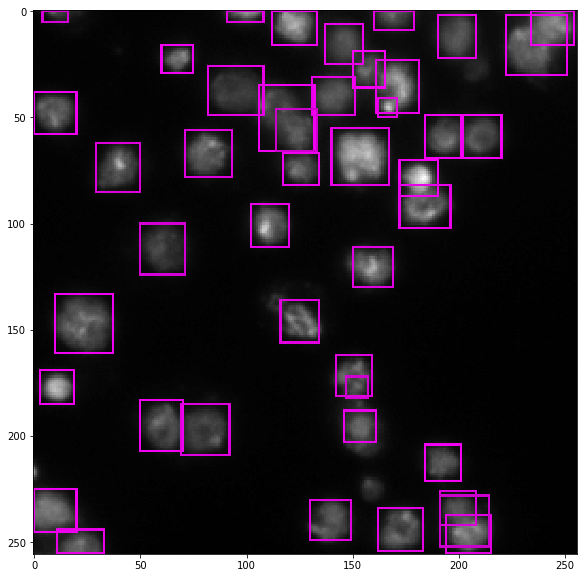

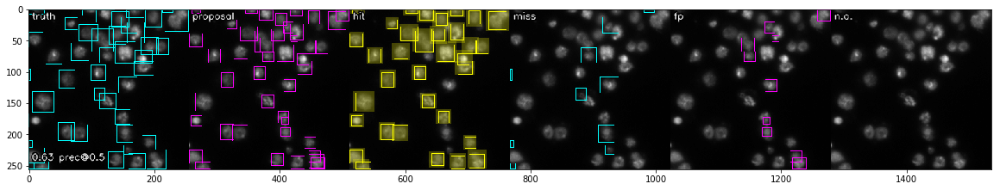

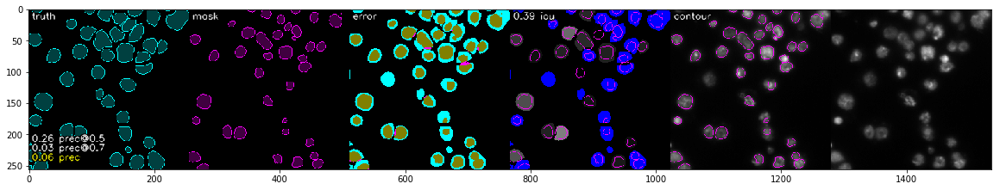

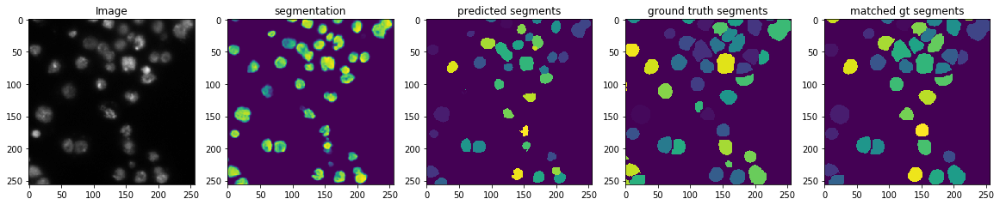

crf:  0.06766906618793198
mask-rcnn:  0.055768515522036655


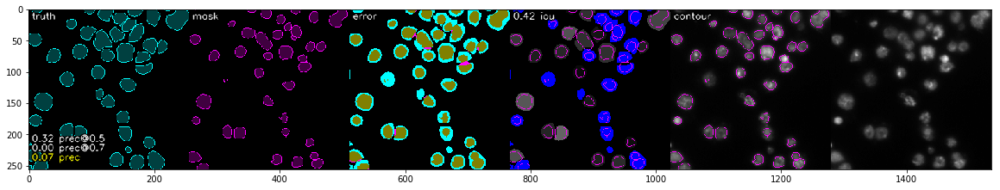

watershed:  0.00734126984126984
crf loss %f tensor(0.7510, device='cuda:0')
29 =======================================


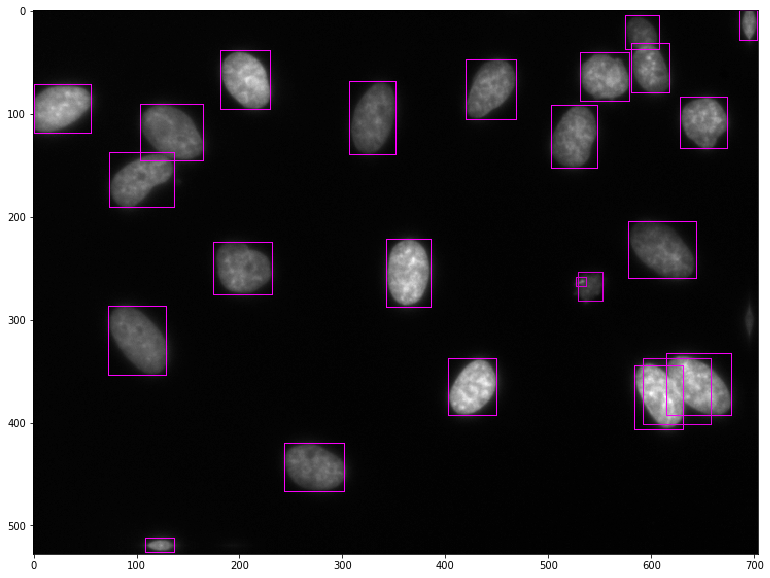

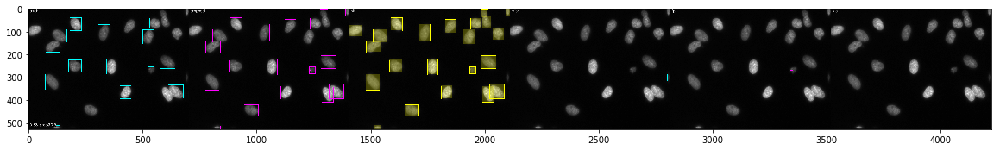

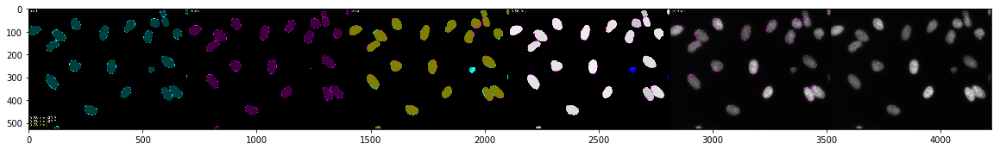

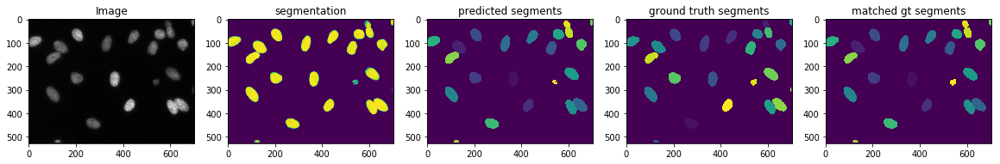

crf:  0.7823529411764706
mask-rcnn:  0.7760989010989011


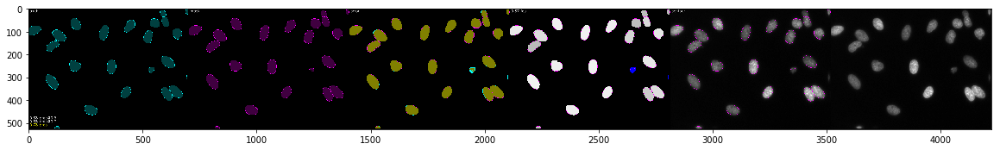

watershed:  0.5720814000814001
crf loss %f tensor(1.00000e-02 *
       5.0340, device='cuda:0')
30 =======================================


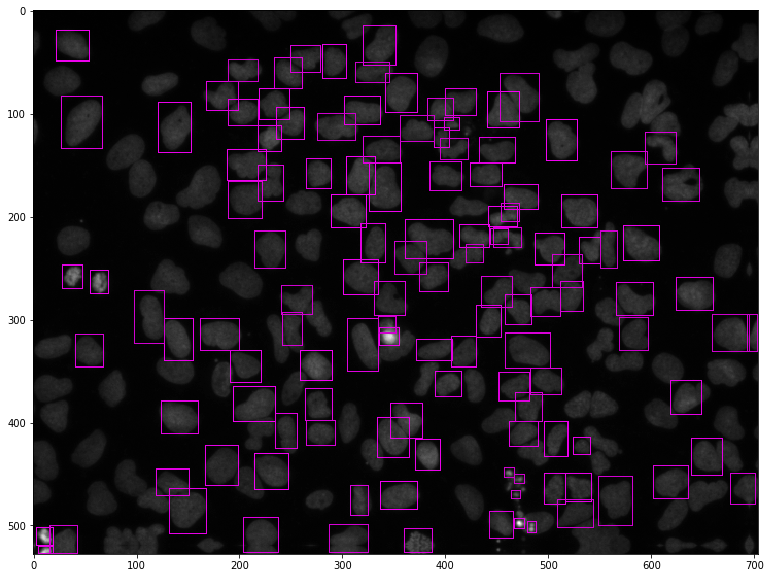

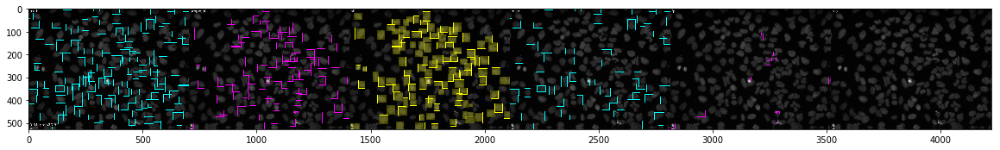

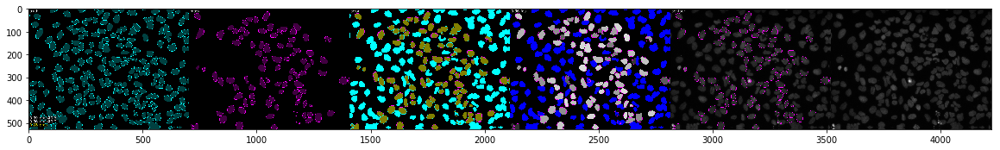

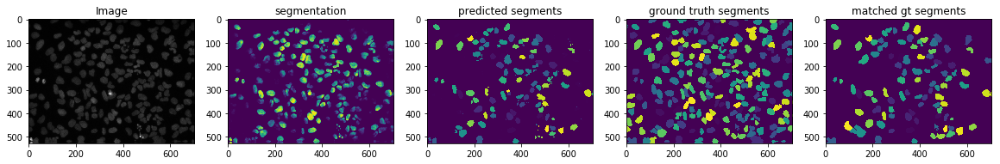

crf:  0.22899378775746554
mask-rcnn:  0.2806471325868301


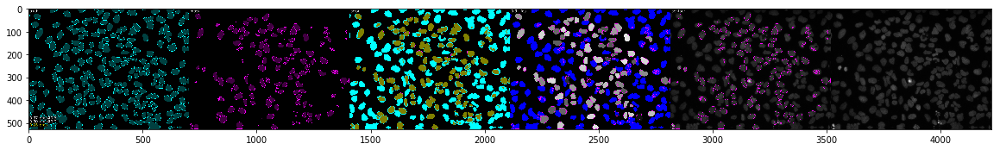

watershed:  0.04422643113235804
crf loss %f tensor(0.6705, device='cuda:0')
31 =======================================


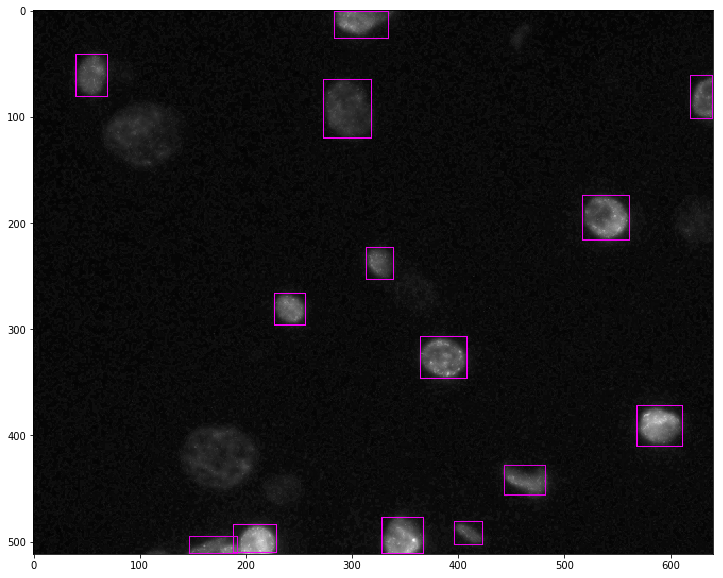

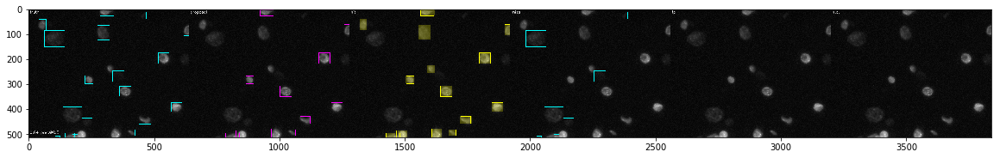

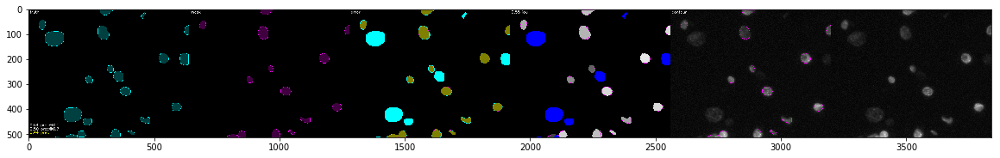

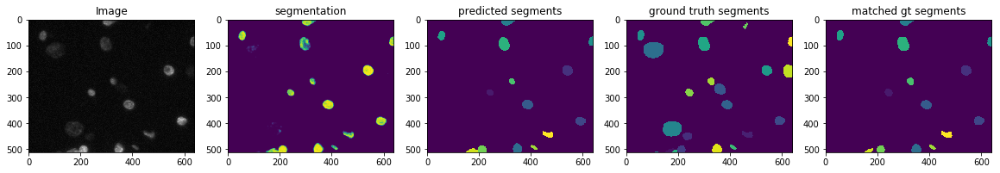

crf:  0.4634091815231245
mask-rcnn:  0.4437503384880664


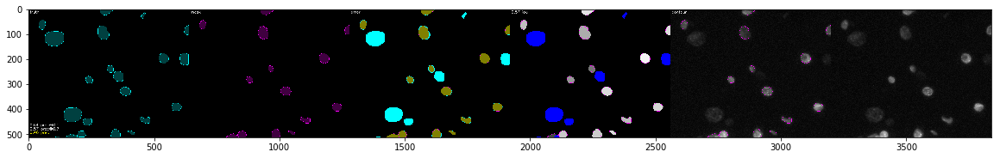

watershed:  0.13041382422187375
crf loss %f tensor(1.00000e-02 *
       2.6504, device='cuda:0')
32 =======================================


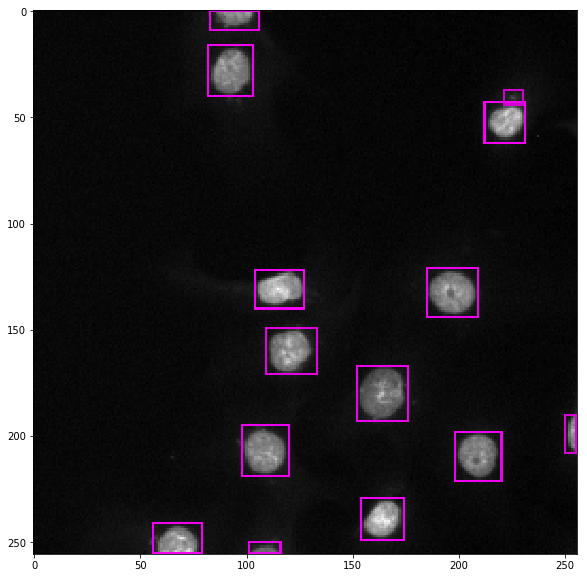

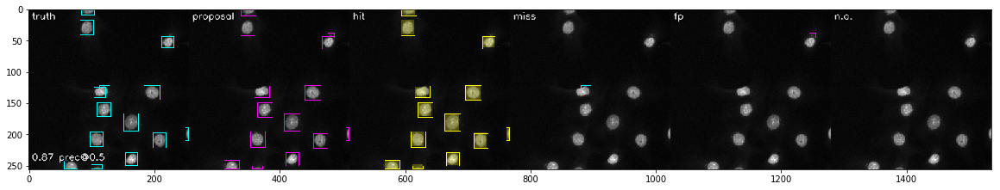

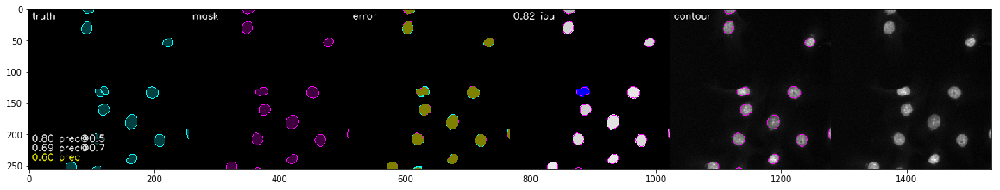

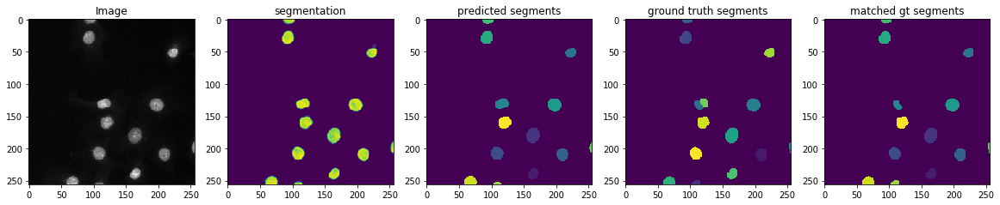

crf:  0.5967499999999999
mask-rcnn:  0.6005


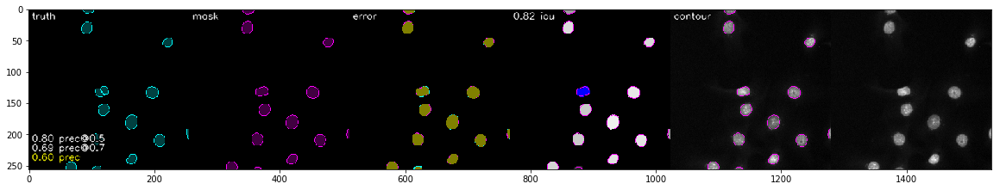

watershed:  0.3410818713450292
crf loss %f tensor(1.00000e-02 *
       3.2838, device='cuda:0')
33 =======================================


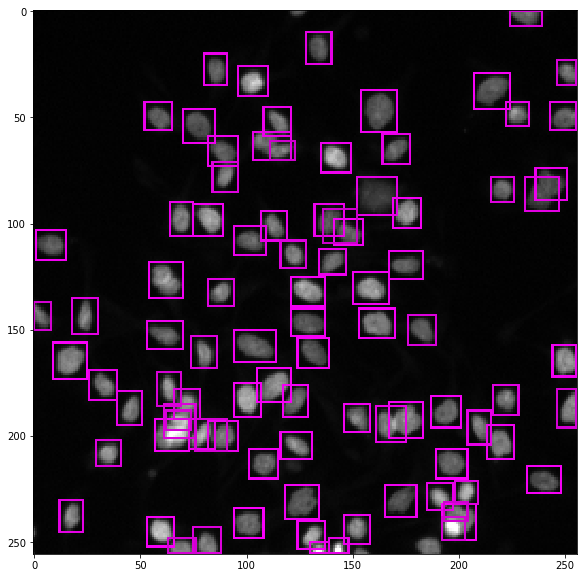

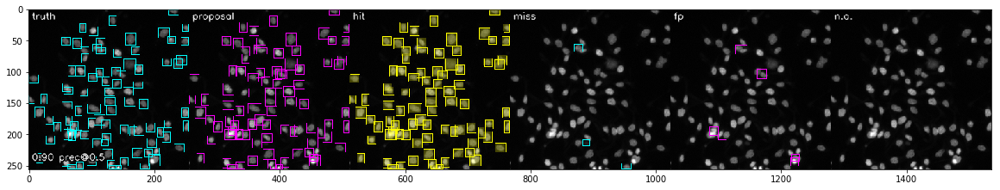

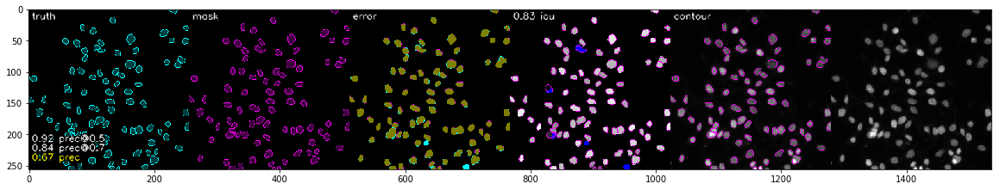

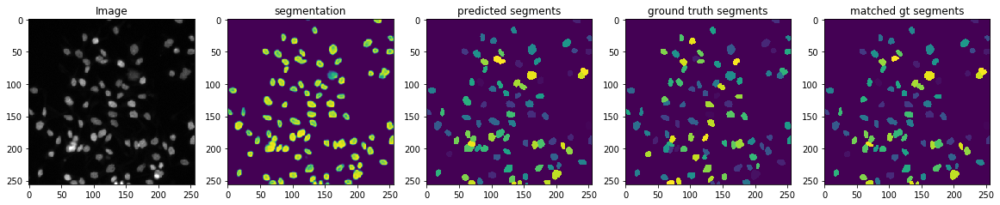

crf:  0.658306556147522
mask-rcnn:  0.6738915045940301


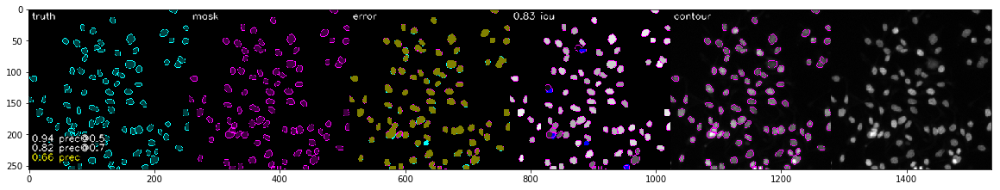

watershed:  0.07990324994400531
crf loss %f tensor(0.2825, device='cuda:0')
34 =======================================


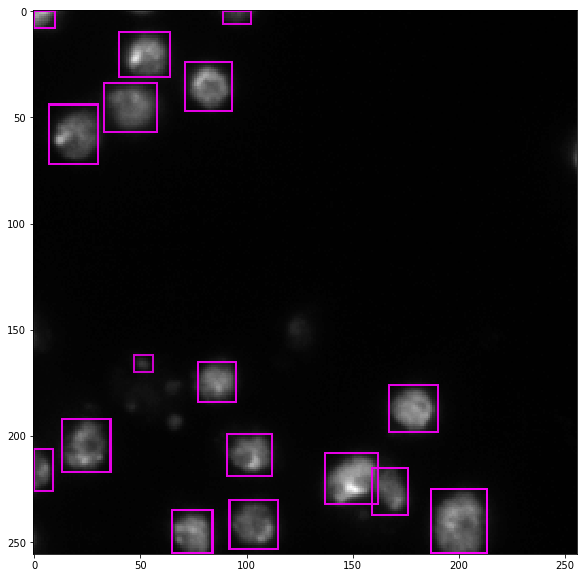

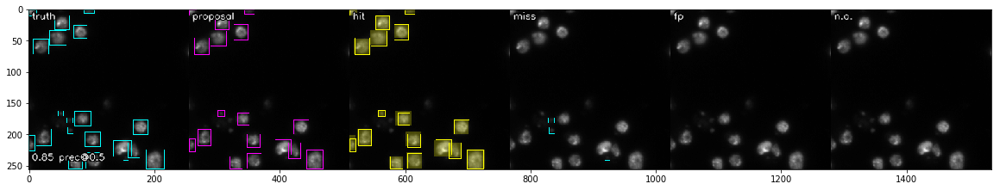

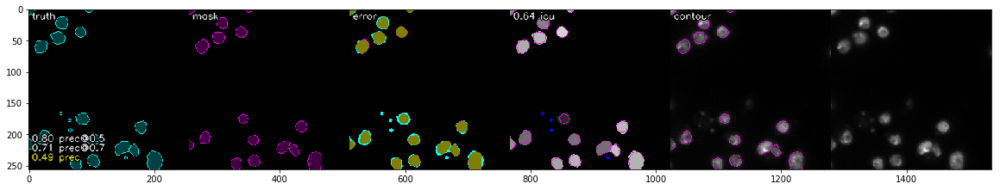

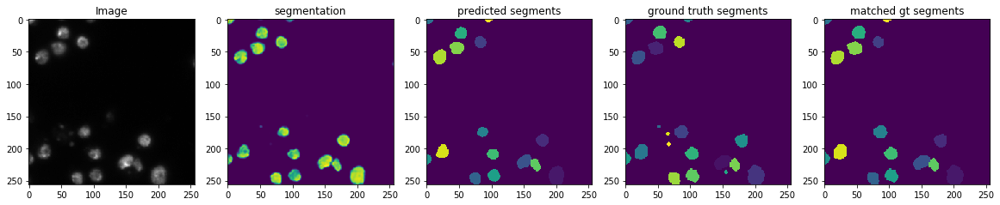

crf:  0.5408373978962215
mask-rcnn:  0.48763933159470685


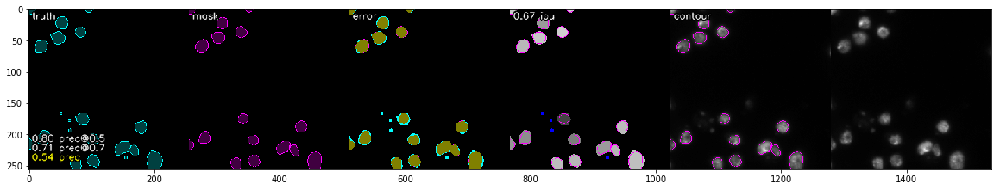

watershed:  0.1091819645732689
crf loss %f tensor(1.00000e-02 *
       5.7758, device='cuda:0')
35 =======================================


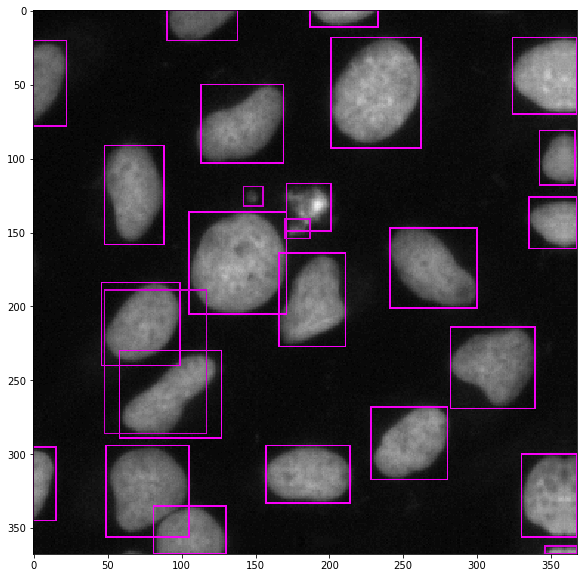

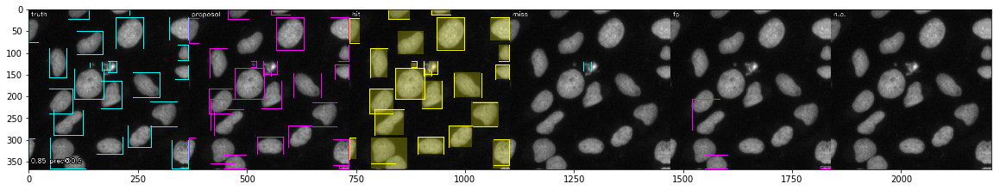

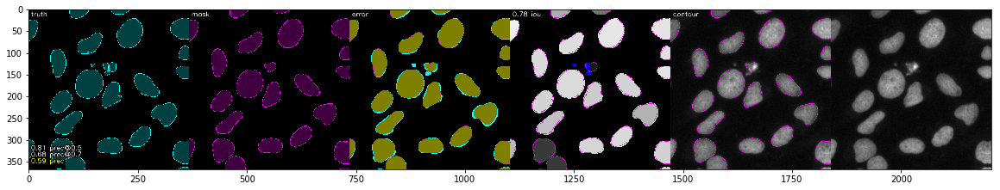

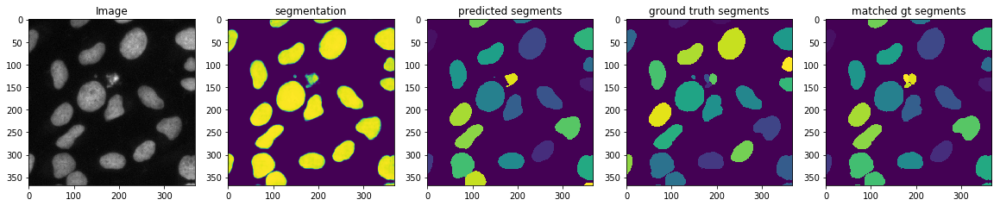

crf:  0.6173194023409542
mask-rcnn:  0.5923049492015009


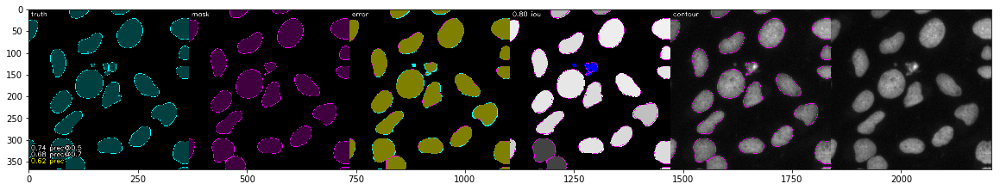

watershed:  0.48058385957842475
crf loss %f tensor(0.1778, device='cuda:0')
36 =======================================


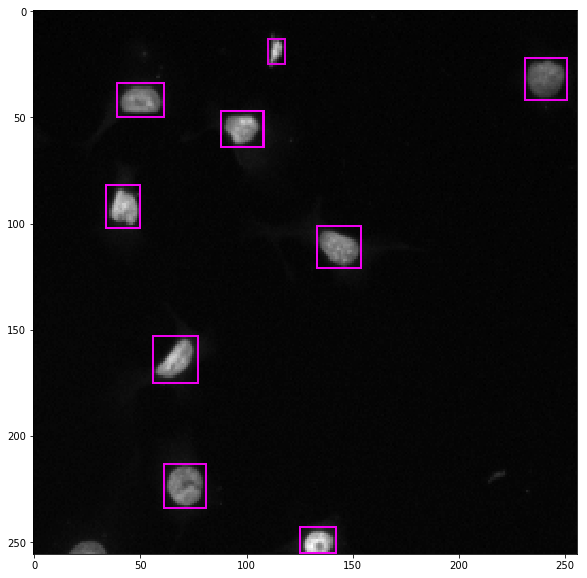

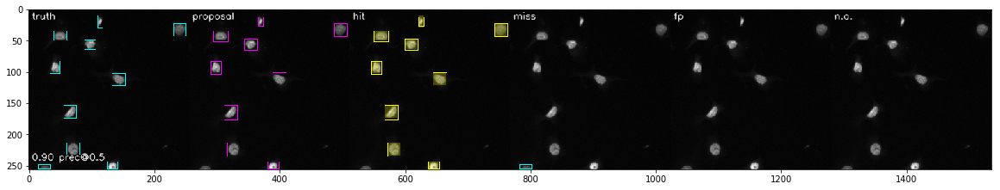

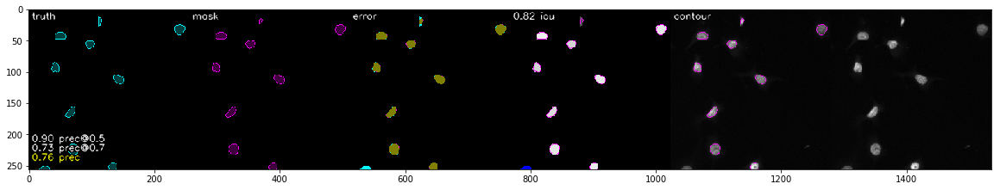

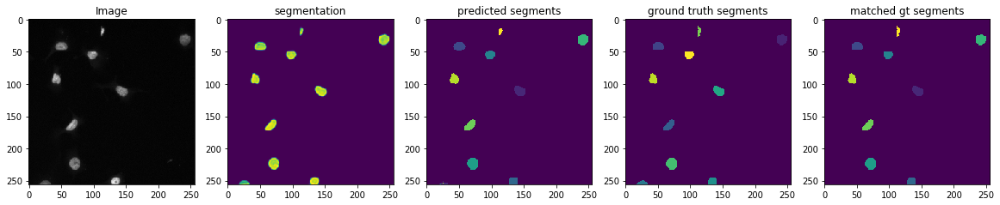

crf:  0.7094516594516594
mask-rcnn:  0.7593506493506494


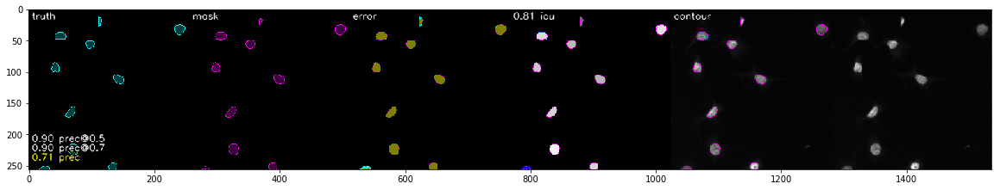

watershed:  0.1714285714285714
crf loss %f tensor(1.00000e-02 *
       1.1892, device='cuda:0')
37 =======================================


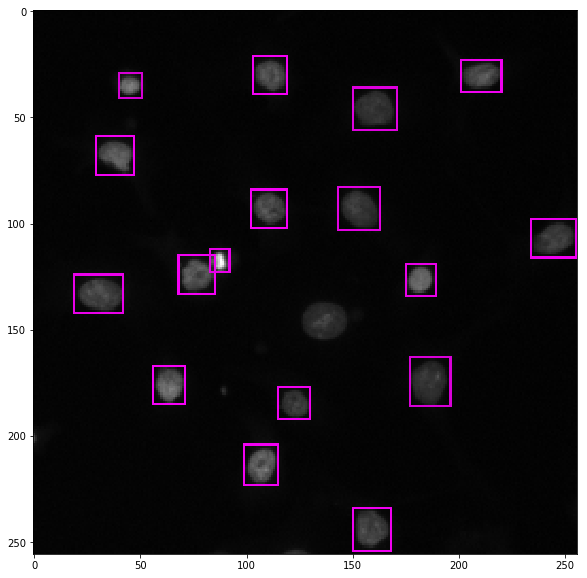

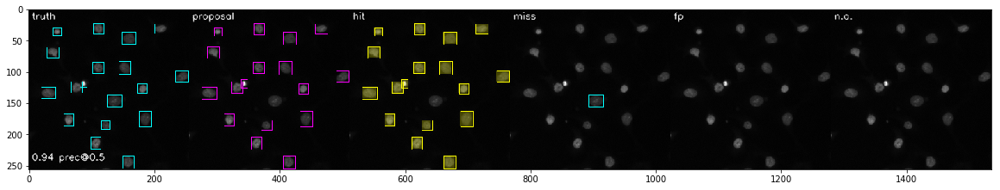

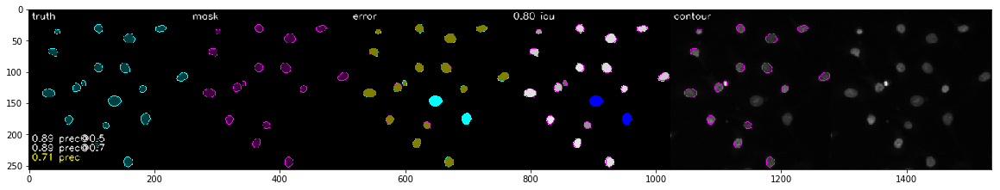

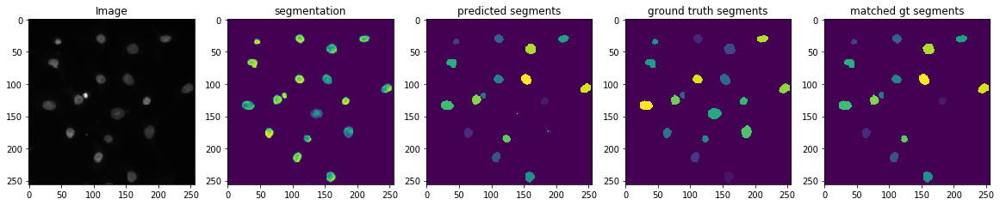

crf:  0.7213657310431503
mask-rcnn:  0.7066406607917644


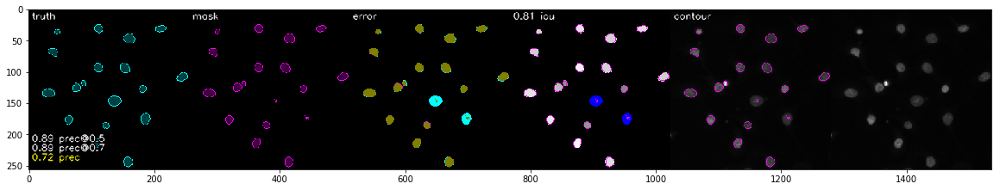

watershed:  0.0
crf loss %f tensor(1.00000e-02 *
       2.8293, device='cuda:0')
38 =======================================


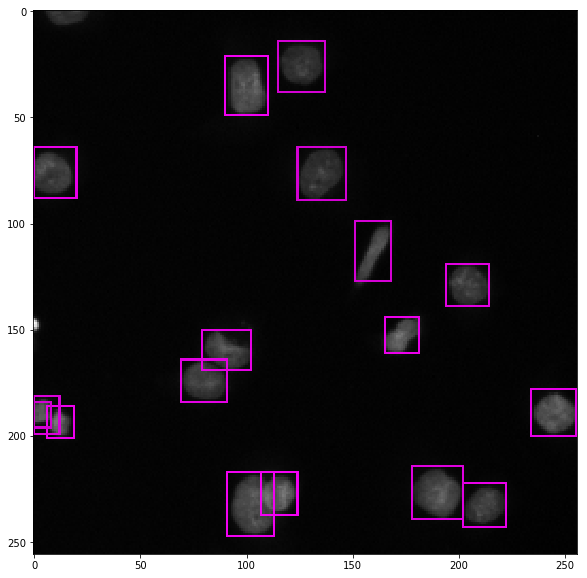

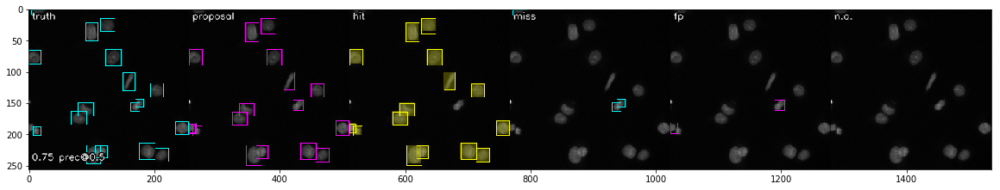

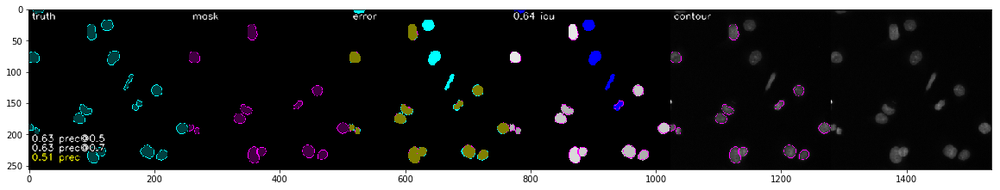

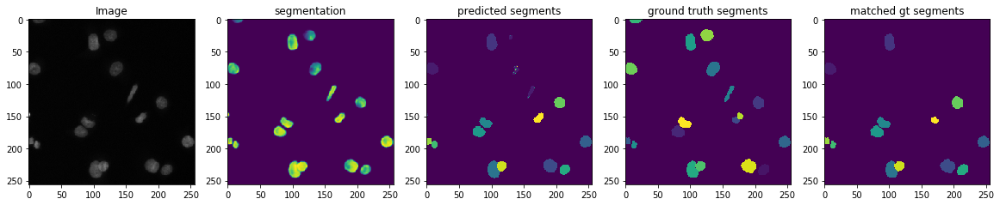

crf:  0.4448341814131288
mask-rcnn:  0.5078724589250905


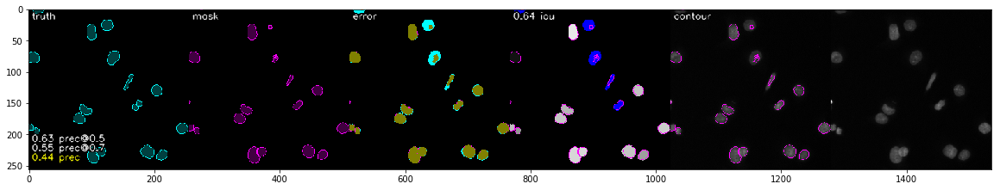

watershed:  0.08749407114624508
crf loss %f tensor(1.00000e-02 *
       5.2927, device='cuda:0')
39 =======================================


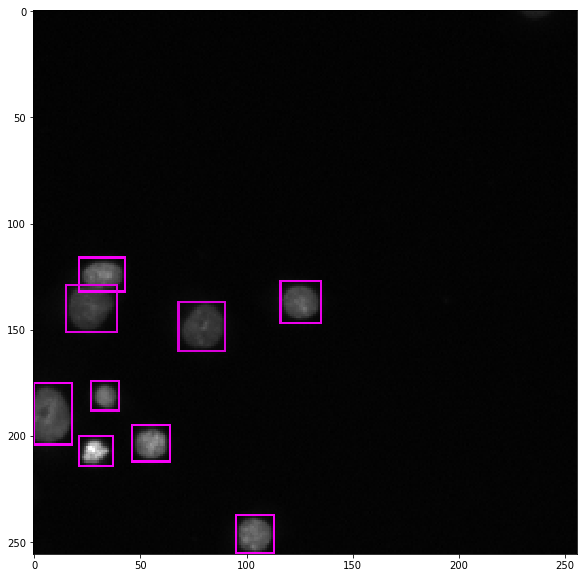

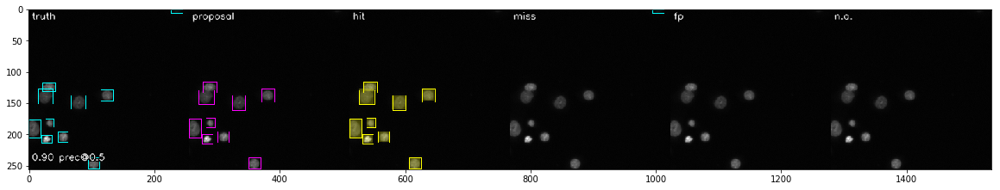

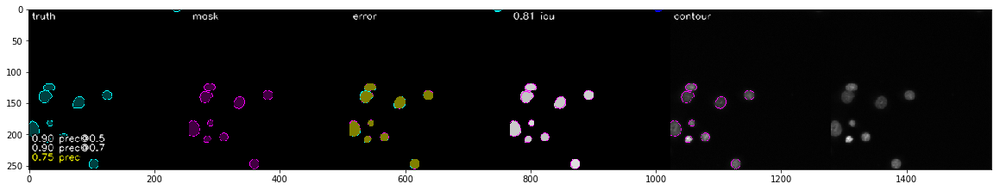

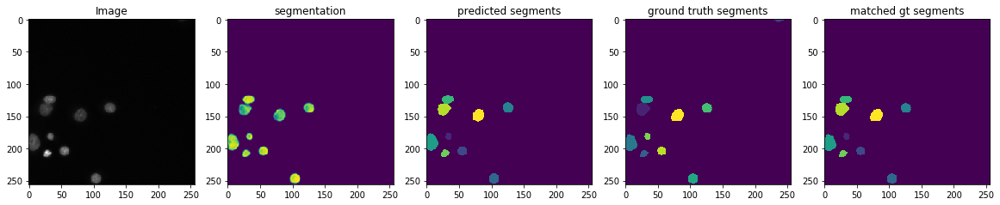

crf:  0.743997113997114
mask-rcnn:  0.7466666666666668


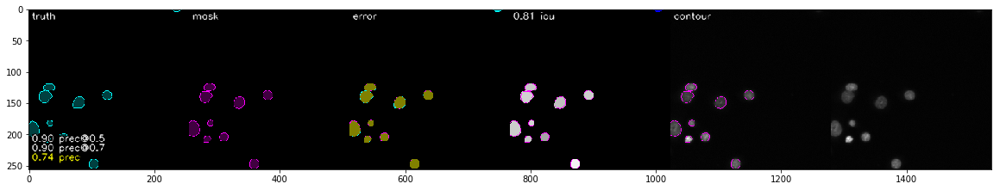

watershed:  0.1173076923076923
crf loss %f tensor(1.00000e-02 *
       1.1419, device='cuda:0')
40 =======================================


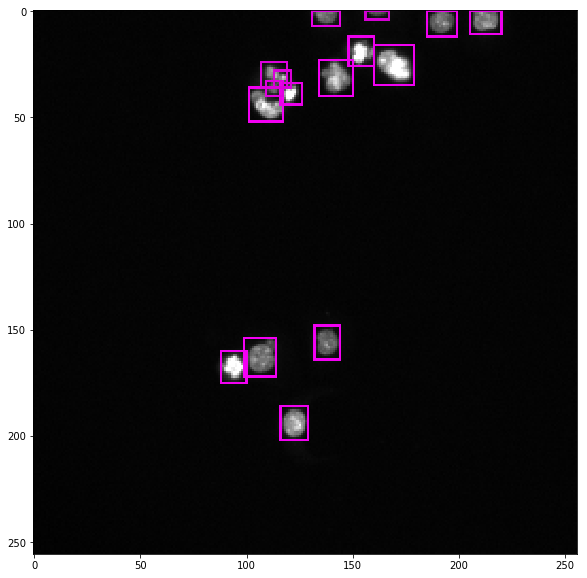

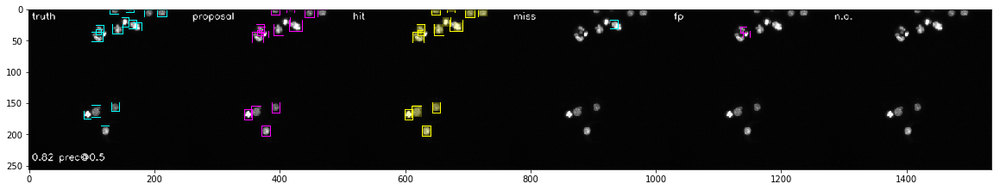

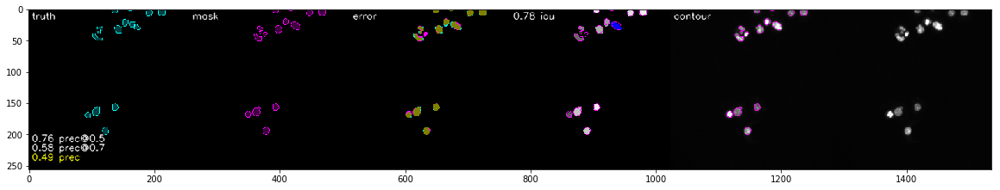

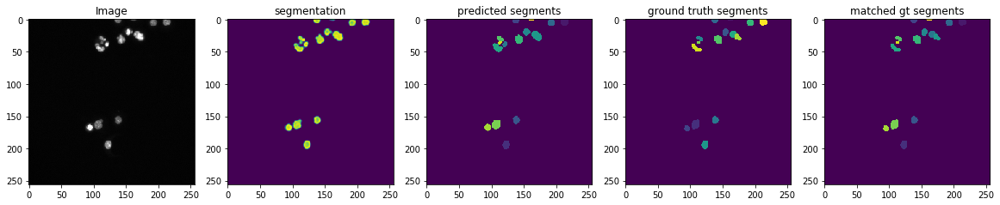

crf:  0.4638290715369823
mask-rcnn:  0.49395689860759184


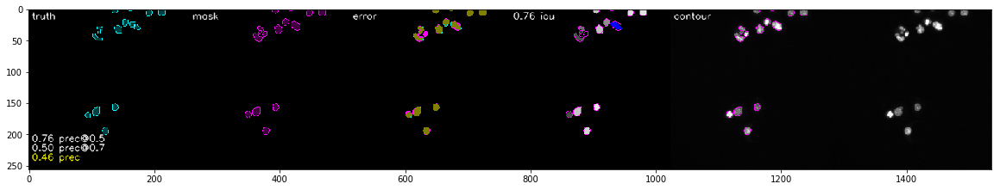

watershed:  0.02631578947368421
crf loss %f tensor(1.00000e-02 *
       3.0285, device='cuda:0')
41 =======================================


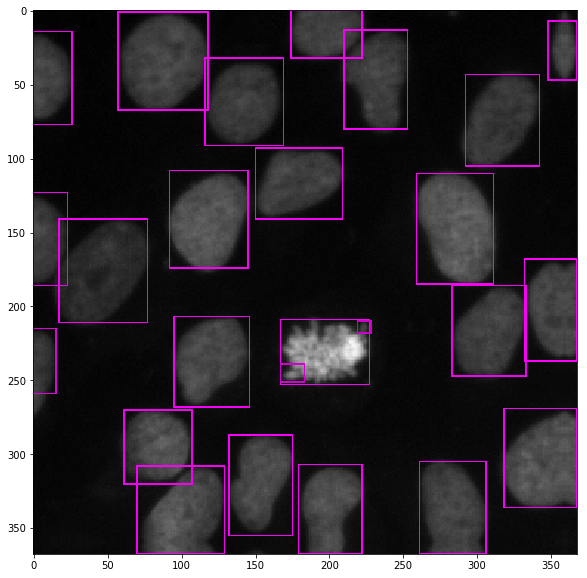

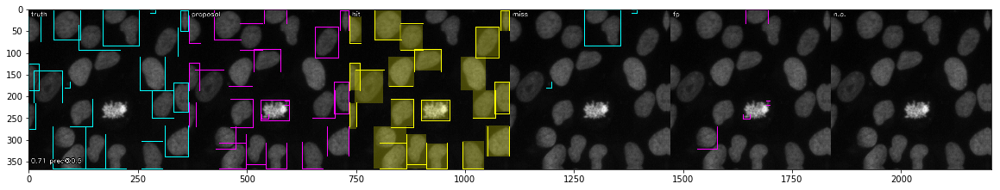

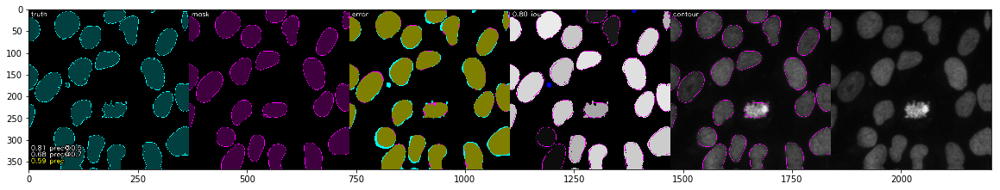

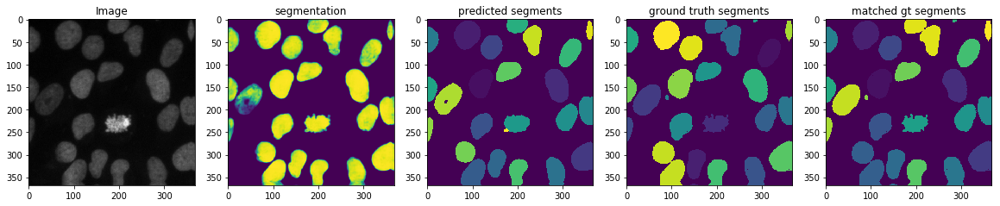

crf:  0.6112285862285863
mask-rcnn:  0.5864406807585218


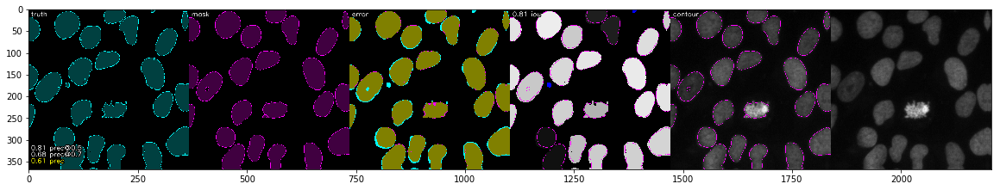

watershed:  0.3170257037943697
crf loss %f tensor(0.3016, device='cuda:0')
42 =======================================


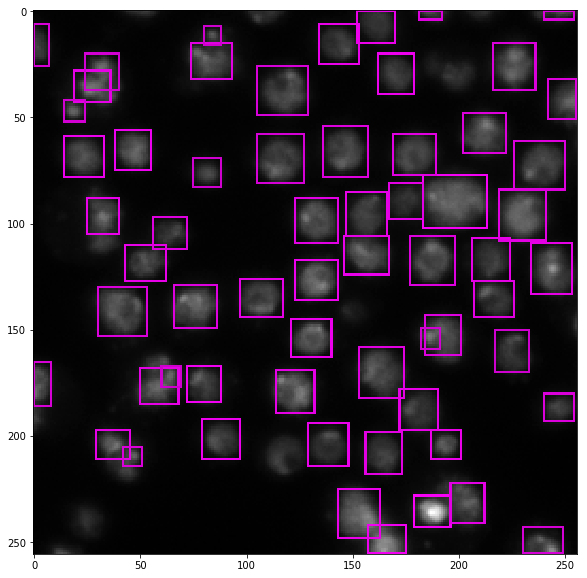

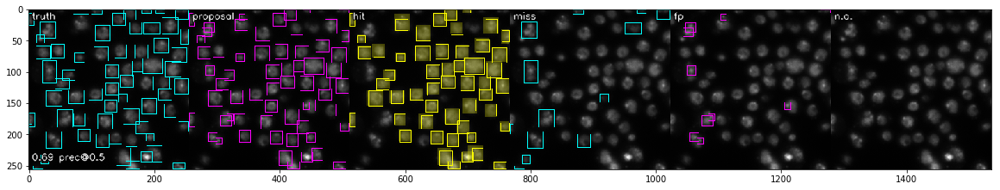

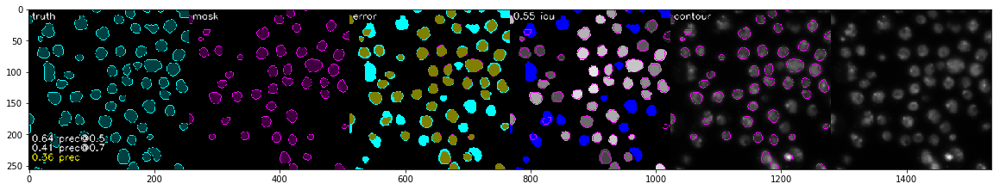

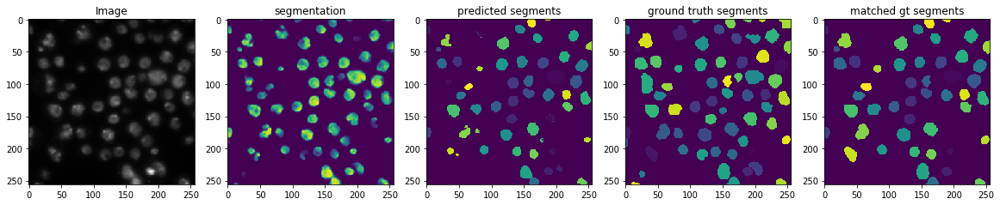

crf:  0.3247636683880293
mask-rcnn:  0.3596681059181913


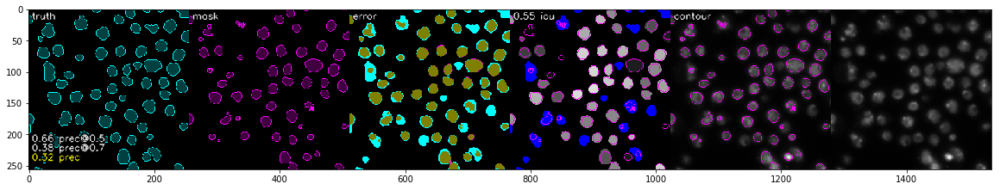

watershed:  0.026258068444769207
crf loss %f tensor(0.3845, device='cuda:0')
43 =======================================


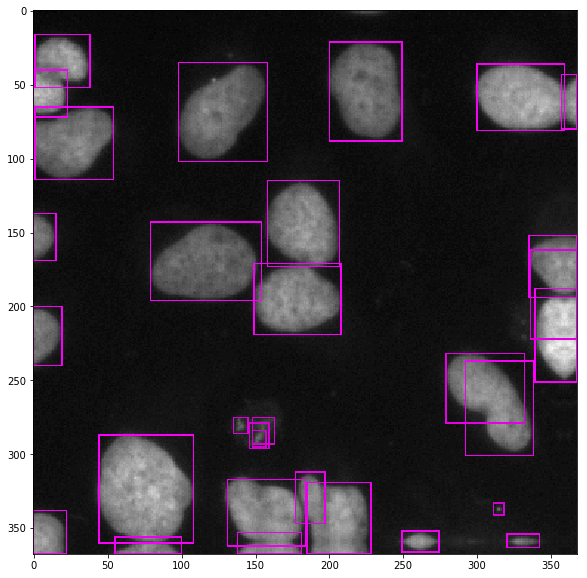

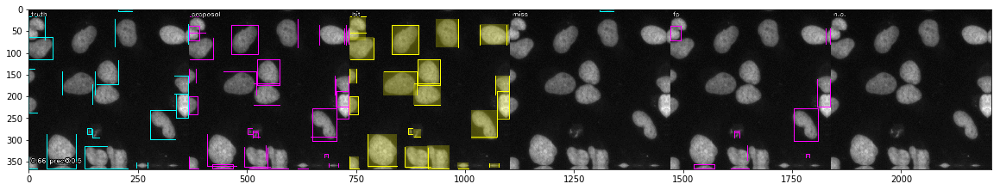

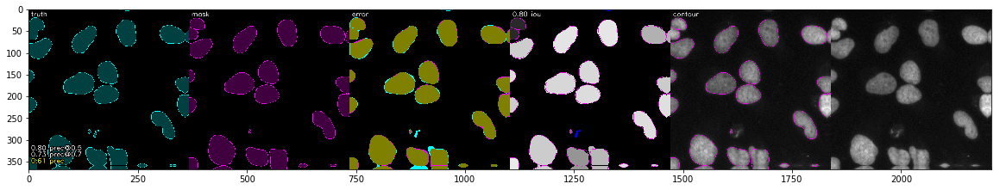

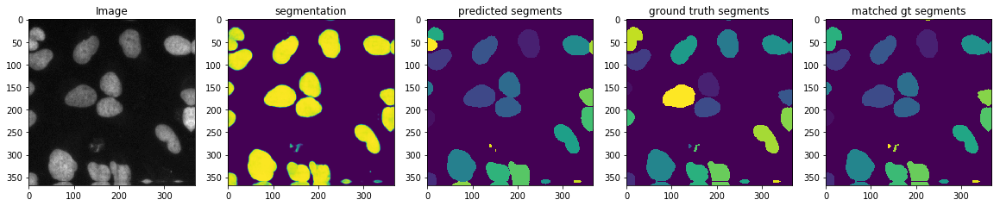

crf:  0.6039643689643689
mask-rcnn:  0.6115965885181034


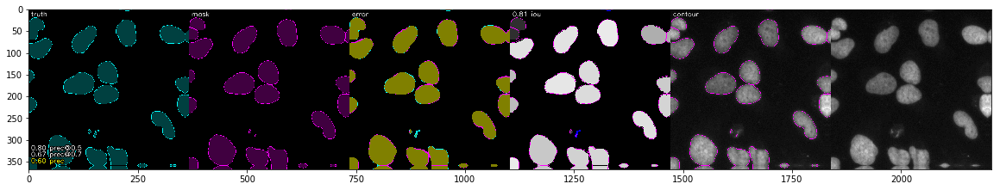

watershed:  0.5822996882125737
crf loss %f tensor(0.1610, device='cuda:0')
44 =======================================


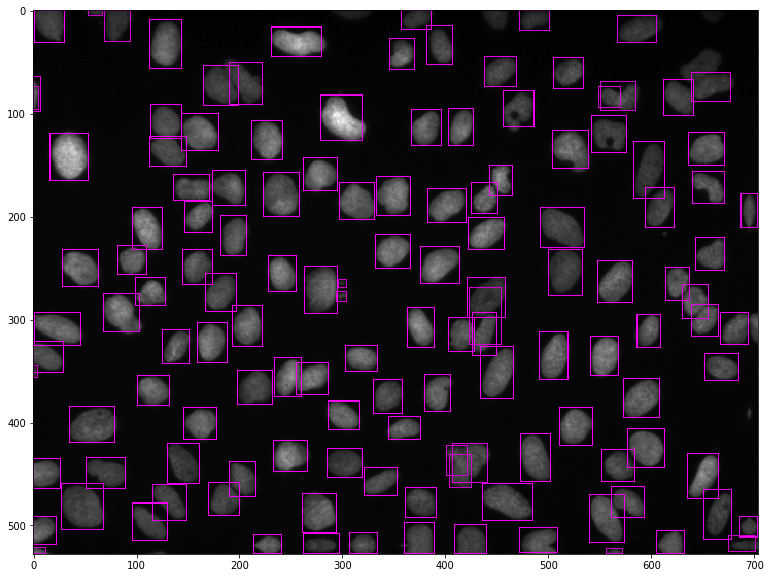

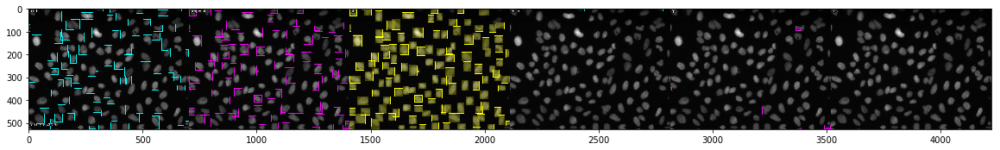

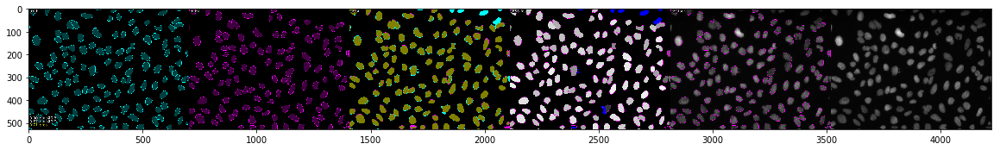

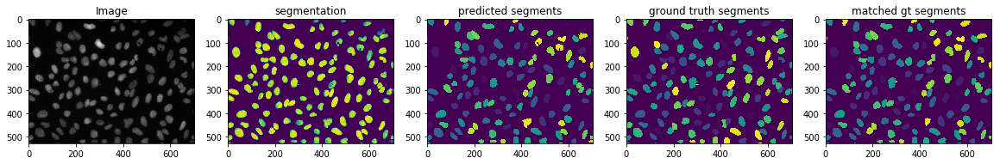

crf:  0.7388080044646822
mask-rcnn:  0.7069194147006334


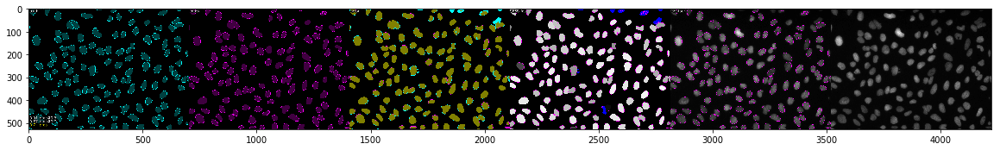

watershed:  0.49885177846043016
crf loss %f tensor(0.4988, device='cuda:0')
45 =======================================
crf mask_average_precision = 0.62001

mask-rcnn mask_average_precision = 0.61269

watershed_average_precisions = 0.22762



In [3]:
id = 4
test_num  = 0
test_loss = np.zeros(6,np.float32)
#return test_loss
net.set_mode('eval')
net.eval()
mask_average_precisions = []
mask_mask_average_precisions = []
watershed_average_precisions = []
for i, (inputs, truth_boxes, truth_labels, truth_instances, metas, indices, truth_foregrounds, images) in enumerate(eval_loader, 0):
#     if i != id:
#         continue
    
    with torch.no_grad():
        inputs = Variable(inputs).cuda()
        truth_foregrounds = Variable(truth_foregrounds).cuda()
        net(inputs, truth_boxes, truth_labels, truth_instances, shapes)
#         loss = net.loss( inputs, truth_boxes, truth_labels, truth_instances, truth_foregrounds)
        crf_loss = net.crf_net_loss(truth_instances)
    
        truth_masks = instance_to_multi_mask(truth_instances[0])
        
        res = draw_multi_rpn_proposal(cfg, images[0], net.rpn_proposals.cpu().data.numpy())
        plt.figure(figsize=(20,10))
        plt.imshow(res)
        plt.show()
        
        res = draw_multi_proposal_metric(cfg, images[0], net.detections.cpu().data.numpy(), truth_boxes[0], truth_labels[0])
        plt.figure(figsize=(20,10))
        plt.imshow(res)
        plt.show()
        
        res = draw_mask_metric(cfg, images[0], net.masks[0], truth_boxes[0], truth_labels[0], truth_instances[0])
        plt.figure(figsize=(20,10))
        plt.imshow(res)
        plt.show()
        
        plt.figure(figsize=(20,10))
        plt.subplot(151)
        plt.imshow(images[0])
        plt.title('Image')
        
        plt.subplot(152)
        plt.imshow(net.segmentation[1,:,:].detach())
#         plt.colorbar()
        plt.title('segmentation')
        
        plt.subplot(153)
        plt.imshow(net.classes.detach())
#         plt.colorbar()
        plt.title('predicted segments')
        
        plt.subplot(154)
        plt.imshow(truth_masks)
#         plt.colorbar()
        plt.title('ground truth segments')
    
        plt.subplot(155)
        plt.imshow(net.target.detach())
#         plt.colorbar()
        plt.title('matched gt segments')
        
        plt.show()
        
        mask = net.classes.cpu().data.numpy()
        truth_mask = truth_masks
        mask_average_precision, mask_precision =\
            compute_average_precision_for_mask(mask, truth_mask, t_range=np.arange(0.5, 1.0, 0.05))
        print('crf: ', mask_average_precision)
        mask_average_precisions.append(mask_average_precision)
        
        mask_average_precision, mask_precision =\
            compute_average_precision_for_mask(net.masks[0], truth_mask, t_range=np.arange(0.5, 1.0, 0.05))
        print('mask-rcnn: ', mask_average_precision)
        mask_mask_average_precisions.append(mask_average_precision)
        
        # Draw metric error
        H, W, _ = images[0].shape
        mask = mask[:H, :W]
        truth_mask = truth_mask[:H, :W]
        res = draw_mask_metric(cfg, images[0], mask, truth_boxes[0], truth_labels[0], truth_instances[0])

        plt.figure(figsize=(20,10))
        plt.imshow(res)
        plt.show()
        
        markers = watershed(net.segmentation[1,:,:].cpu().data.numpy())
        watershed_map, mask_precision =\
            compute_average_precision_for_mask(markers, truth_mask, t_range=np.arange(0.5, 1.0, 0.05))
        watershed_average_precisions.append(watershed_map)
        print('watershed: ', watershed_map)
        
        print('crf loss %f', crf_loss)
                
#         mask_metric = draw_mask_metric(cfg, image, mask, truth_box, truth_label, truth_instance)
#         plt.imishow(mask_metric)
#         plt.show()
        
    batch_size = len(indices)
    # print(net.loss.cpu().data.numpy())
    # print(net.foreground_loss.cpu().data.numpy())
    # print(net.border_loss.cpu().data.numpy())
#     test_loss += batch_size*np.array((
#                        net.loss.cpu().data.numpy(),
#                        net.foreground_loss.cpu().data.numpy(),
#                        net.border_loss.cpu().data.numpy(),
#                        0,
#                        0,
#                        0,
#                      ))
    test_num  += batch_size
#     if test_num >= 2:
#         break
#     print(i, ' loss ', net.total_loss)
    print(i, '=======================================')

assert(test_num == len(valid_loader.sampler))
test_loss = test_loss/test_num
mask_average_precisions = np.array(mask_average_precisions)
mask_mask_average_precisions = np.array(mask_mask_average_precisions)
watershed_average_precisions = np.array(watershed_average_precisions)
print('crf mask_average_precision = %0.5f\n'%mask_average_precisions.mean())
print('mask-rcnn mask_average_precision = %0.5f\n'%mask_mask_average_precisions.mean())
print('watershed_average_precisions = %0.5f\n'%watershed_average_precisions.mean())

In [ ]:
?cv2.subtract

In [ ]:
segmentation = F.softmax(net.foregrounds, 1)

boxes, label, mask  = multi_mask_to_annotation(net.masks[0].astype(np.int32))   
ones = np.ones((len(boxes), 1))  
boxes = np.concatenate((boxes, ones), axis=1)    
mask = torch.from_numpy(mask).cuda()

boxes = np.array(boxes, np.float32)
unary = get_unary(segmentation, boxes, shapes, mask, net.crf.w1, net.crf.w2, net.crf.w3, net.crf.w4)

print(boxes[0])
plt.imshow(unary[0][1].detach())
plt.colorbar()
plt.show()


num_instance = len(boxes) + 1
print(num_instance)
box_term = torch.zeros(num_instance, H, W).cuda()
mask_term = torch.zeros(num_instance, H, W).cuda()

boxes = boxes.astype(np.int32)
for i, box in enumerate(boxes):
    x0, y0, x1, y1, s = box[0], box[1], box[2], box[3], box[4]
    box_term[i + 1, y0:y1, x0:x1] = segmentation[0][1][y0:y1, x0:x1] * float(s)
    mask_term[i + 1, y0:y1, x0:x1] = segmentation[0][1][y0:y1, x0:x1] * mask[i, y0:y1, x0:x1].float()
    
plt.imshow(segmentation[0][1])
plt.show()
plt.imshow(box_term[1])
plt.show()
plt.imshow(mask_term[1])
plt.show()

## Val

In [ ]:
id = 4
test_num  = 0
test_loss = np.zeros(6,np.float32)
#return test_loss
# net.crf.reset_parameters()
net.eval()
mask_average_precisions = []
for i, (inputs, truth_foregrounds, foreground_weights, original_foregrounds, truth_borders, images, truth_masks, indices) in enumerate(valid_loader, 0):
#     if i != id:
#         continue
    
    with torch.no_grad():
        inputs = Variable(inputs).cuda()
        truth_foregrounds = Variable(truth_foregrounds).cuda()
        truth_borders     = Variable(truth_borders).cuda()
        foreground_weights= Variable(foreground_weights).cuda()
        original_foregrounds = Variable(original_foregrounds).cuda()
        net.forward( inputs, truth_masks, shapes)
        net.criterion( truth_foregrounds, truth_borders, foreground_weights, original_foregrounds)
        
        plt.figure(figsize=(20,10))
        plt.subplot(151)
        plt.imshow(images[0])
        plt.title('Image')
        
        plt.subplot(152)
        plt.imshow(net.segmentation[1,:,:].detach())
        plt.colorbar()
        plt.title('segmentation')
        
        plt.subplot(153)
        plt.imshow(net.classes.detach())
        plt.colorbar()
        plt.title('predicted segments')
        
        plt.subplot(154)
        plt.imshow(truth_masks[0])
        plt.colorbar()
        plt.title('ground truth segments')
    
        plt.subplot(155)
        plt.imshow(net.target.detach())
        plt.colorbar()
        plt.title('matched gt segments')
        
        plt.show()
        
        mask = net.classes.cpu().data.numpy()
        truth_mask = truth_masks[0]
        mask_average_precision, mask_precision =\
            compute_average_precision_for_mask(mask, truth_mask, t_range=np.arange(0.5, 1.0, 0.05))
        print(mask_average_precision)
        mask_average_precisions.append(mask_average_precision)
        
#         mask_metric = draw_mask_metric(cfg, image, mask, truth_box, truth_label, truth_instance)
#         plt.imishow(mask_metric)
#         plt.show()
        
    batch_size = len(indices)
    # print(net.loss.cpu().data.numpy())
    # print(net.foreground_loss.cpu().data.numpy())
    # print(net.border_loss.cpu().data.numpy())
    test_loss += batch_size*np.array((
                       net.loss.cpu().data.numpy(),
                       net.foreground_loss.cpu().data.numpy(),
                       net.border_loss.cpu().data.numpy(),
                       0,
                       0,
                       0,
                     ))
    test_num  += batch_size
    print(i, ' loss ', net.total_loss)

assert(test_num == len(valid_loader.sampler))
test_loss = test_loss/test_num
mask_average_precisions = np.array(mask_average_precisions)
print('mask_average_precision = %0.5f\n'%mask_average_precisions.mean())

In [ ]:
plt.imshow(images[0])
plt.show()

In [ ]:
print(net.overlap.t())
g = GFG(net.overlap.t())
# Ground truth matched to prediction
match = g.maxBPM()

In [ ]:
match

In [ ]:
for i in range(len(net.gt_instance)):
    if match[i] != -1:
        plt.subplot(121)
        plt.imshow(net.gt_instance[i])
        
        plt.subplot(122)
        plt.imshow(net.pred_instance[match[i]])
        plt.show()
        print(net.overlap[i, :])
        print(net.overlap[i, match[i]])

## Train

In [ ]:
net.crf.reset_parameters()
# net.crf.w1[0] = 0.5
# net.crf.w2[0] = 0.5
# net.crf.w3[0] = 0.5
# net.crf.compatibility_matrix[0] = 0.0
# net.crf.compatibility_matrix[1] = 1.0 
# net.crf.spatial_ker_weights[0] = 1.0
# net.crf.bilateral_ker_weights[0] = 1.0

In [ ]:
net.train()

optimizer.zero_grad()
i = 2
input, foreground, foreground_weights, origianl_foregrounds, distance, image, mask, index = train_dataset[i]
input.shape

inputs = Variable(input.unsqueeze(0)).cuda()
truth_foregrounds = Variable(foreground.unsqueeze(0)).cuda()
truth_borders   = Variable(distance.unsqueeze(0)).cuda()
foreground_weights= Variable(foreground_weights.unsqueeze(0)).cuda()
origianl_foregrounds = Variable(origianl_foregrounds).cuda()
truth_masks = mask[np.newaxis, :, :]
images = image[np.newaxis, ...]

net.forward(inputs, truth_masks, shapes)
net.criterion(truth_foregrounds, truth_borders, foreground_weights, origianl_foregrounds)

plt.figure(figsize=(20,10))
plt.subplot(151)
plt.imshow(images[0])
plt.title('Image')

plt.subplot(152)
plt.imshow(net.segmentation[1,:,:].detach())
plt.colorbar()
plt.title('segmentation')

plt.subplot(153)
plt.imshow(net.classes.detach())
plt.colorbar()
plt.title('predicted segments')

plt.subplot(154)
plt.imshow(truth_masks[0])
plt.colorbar()
plt.title('ground truth segments')

plt.subplot(155)
plt.imshow(net.target.detach())
plt.colorbar()
plt.title('matched gt segments')

plt.show()

print(net.foreground_loss)
print(net.border_loss)

plt.imshow(foreground_weights.squeeze(), cmap='gray')
plt.colorbar()
plt.show()

In [ ]:
net.loss.backward()
# torch.nn.utils.clip_grad_norm_(net.parameters(), 1e9)
optimizer.step()

In [2]:
print(net.crf.w1)
print(net.crf.w2)
print(net.crf.w3)
print(net.crf.w4)
print(net.crf.compatibility_matrix)
print(net.crf.spatial_ker_weights)
print(net.crf.bilateral_ker_weights)

Parameter containing:
tensor([ 0.1000], device='cuda:0')
Parameter containing:
tensor(1.00000e-02 *
       [ 4.0474], device='cuda:0')
Parameter containing:
tensor([ 0.2291], device='cuda:0')
Parameter containing:
tensor([ 0.5756], device='cuda:0')
Parameter containing:
tensor([-0.2594,  1.2582], device='cuda:0')
Parameter containing:
tensor([ 0.6991], device='cuda:0')
Parameter containing:
tensor([ 0.8142], device='cuda:0')


In [ ]:
import torch.nn.functional as F
F.relu(net.crf.w2)

In [ ]:
list(net.parameters())